<center><font size='6'>Superkart Sales Forecasting and Prediction</font></center>

<center><img src="deployment_files/frontend_files/Superkart.png" width="100"></center>
<center><font size=6>Model Containerization and Deployment</center>

# Executive Summary

This project presents a full-stack machine learning solution to forecast monthly product-level sales for SuperKart, a fictional multi-store retail platform. The objective is to empower SuperKart with data-driven insights to improve business planning, inventory allocation, and supply chain efficiency across diverse store locations.

The notebook walks through the complete ML lifecycle — from data exploration and feature engineering to model development, hyperparameter tuning, and deployment. Two regression algorithms — Random Forest and XGBoost — were evaluated, with the final tuned model achieving strong predictive performance on unseen data.

To ensure real-world usability and scalability, the project adopts a decoupled, production-ready architecture:

- A Streamlit frontend for business users to interact with the model

- A Flask backend serving the trained model via a RESTful API

- Docker containers for reproducible deployment

- Hosting via Hugging Face Spaces, allowing public or internal access

By combining predictive modeling with modern MLOps practices, this solution supports SuperKart's ability to anticipate demand, reduce stockouts, minimize overstocking, and enhance operational decision-making — all while remaining flexible, portable, and ready for scale.

## Table of Contents

- [Executive Summary](#executive-summary)
- [Problem Statement](#problem-statement)
- [Business Context](#business-context)
- [Objective](#objective)
- [Data Description](#data-description)
- [Installs and Imports](#installs-and-imports)
- [Data Overview](#data-overview)
- [Load the dataset](#load-the-dataset)
- [Data Overview](#data-overview)
- [Data Cleansing for Product_Sugar_Content Prior to EDA](#data-cleansing-for-productsugarcontent-prior-to-eda)
- [Value Counts for Categorical Features](#value-counts-for-categorical-features)
- [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
  - [Univariate Analysis — Numerical Features](#univariate-analysis--numerical-features)
  - [Univariate Analysis — Categorical Features](#univariate-analysis--categorical-features)
- [Bivariate Analysis](#bivariate-analysis)
  - [Visualizing Relationships Between Numeric Features and Sales](#visualizing-relationships-between-numeric-features-and-sales)
    - [Numerical features in the dataset](#numerical-features-in-the-dataset)
  - [Distribution of our target variable against categorical variables for additional insight.](#distribution-of-our-target-variable-against-categorical-variables-for-additional-insight)
    - [Utility function for our Boxplots and Barplots for our categorical features](#utility-function-for-our-boxplots-and-barplots-for-our-categorical-features)
    - [Store Types that drive Highest Sales Revenue](#store-types-that-drive-highest-sales-revenue)
    - [Store Sizes that drive the Highest Sales Revenue](#store-sizes-that-drive-the-highest-sales-revenue)
    - [Store Location City Types that drive the Highest Sales Revenue](#store-location-city-types-that-drive-the-highest-sales-revenue)
    - [Product Types that drive the Highest Sales Revenue](#product-types-that-drive-the-highest-sales-revenue)
    - [Product_Sugar_Content that drives Sales Revenue](#productsugarcontent-that-drives-sales-revenue)
    - [Store that drives the Most Sales Revenue](#store-that-drives-the-most-sales-revenue)
    - [Pivot Table all numeric fields](#pivot-table-all-numeric-fields)
  - [Field Level Analysis](#field-level-analysis)
    - [Details of each store sorted by average total sales by store?](#details-of-each-store-sorted-by-average-total-sales-by-store)
    - [The total sales revenue by **Product Type** per Store](#the-total-sales-revenue-by-product-type-per-store)
    - [Data in a Heatmap](#data-in-a-heatmap)
  - [Let's do a deeper analysis of each store](#lets-do-a-deeper-analysis-of-each-store)
    - [Store OUT001](#store-out001)
    - [Store OUT002](#store-out002)
    - [Store OUT003](#store-out003)
    - [Store OUT004](#store-out004)
  - [Final Data Checks](#final-data-checks)
    - [1. Check for Class Imbalance (Categorical Features)](#1-check-for-class-imbalance-categorical-features)
    - [2. Check for Outliers (Numerical Features)](#2-check-for-outliers-numerical-features)
    - [3. Re-Check for any missing data](#3-re-check-for-any-missing-data)
    - [4. Skewness Check for Target and Predictors](#4-skewness-check-for-target-and-predictors)
- [Data Preprocessing](#data-preprocessing)
    - [Transform **Product_Allocated_Area** to adjust for skewness](#transform-productallocatedarea-to-adjust-for-skewness)
    - [Transform **Product_Sugar_Content** column](#transform-productsugarcontent-column)
    - [Address the high number of Product Types (16) to see if we can group them.](#address-the-high-number-of-product-types-16-to-see-if-we-can-group-them)
- [Data Preparation for Modeling](#data-preparation-for-modeling)
    - [Drop Unnecessary Columns](#drop-unnecessary-columns)
    - [Separating Features and Target](#separating-features-and-target)
    - [Train-Test Split](#train-test-split)
  - [Data Pre-processing Pipeline](#data-pre-processing-pipeline)
- [Model Building](#model-building)
  - [Define functions for Model Evaluation](#define-functions-for-model-evaluation)
  - [Random Forest Regressor - Model Training Pipeline - Base Model](#random-forest-regressor---model-training-pipeline---base-model)
    - [Create a Pipeline with Preprocessing and Model](#create-a-pipeline-with-preprocessing-and-model)
    - [Fit the Pipeline](#fit-the-pipeline)
    - [Evaluate Model Performance on Training and Test](#evaluate-model-performance-on-training-and-test)
  - [Random Forest Regressor - Hyperparameter Tuning](#random-forest-regressor---hyperparameter-tuning)
    - [Evaluate Model Performance on Training and Test for the Hypertuned Random Forest Model](#evaluate-model-performance-on-training-and-test-for-the-hypertuned-random-forest-model)
  - [XGBoost Regressor - Model Training Pipeline](#xgboost-regressor---model-training-pipeline)
    - [Create a Pipeline with Preprocessing and Model](#create-a-pipeline-with-preprocessing-and-model)
    - [Fit the Pipeline](#fit-the-pipeline)
    - [Evaluate Model Performance on Training and Test](#evaluate-model-performance-on-training-and-test)
  - [XGBoost Regressor - Hyperparameter Tuning](#xgboost-regressor---hyperparameter-tuning)
    - [Evaluate Model Performance on Training and Test for the Hypertuned XGBoost Model](#evaluate-model-performance-on-training-and-test-for-the-hypertuned-xgboost-model)
  - [Model Performance Comparison and Final Model Selection](#model-performance-comparison-and-final-model-selection)
- [Model Serialization & Sanity Check](#model-serialization--sanity-check)
- [Hugginface setup](#hugginface-setup)
- [**Deployment - Backend**](#deployment---backend)
  - [Flask Web Framework](#flask-web-framework)
  - [Dependencies File](#dependencies-file)
  - [Dockerfile](#dockerfile)
  - [Uploading Files to Hugging Face Space (Docker Space)](#uploading-files-to-hugging-face-space-docker-space)
- [**Deployment - Frontend**](#deployment---frontend)
  - [Streamlit for Interactive UI](#streamlit-for-interactive-ui)
  - [Dependencies File](#dependencies-file)
  - [DockerFile](#dockerfile)
  - [Frontend File Upload](#frontend-file-upload)
- [Demo](#demo)
  - [Inferencing using Flask API](#inferencing-using-flask-api)
  - [Online Inference](#online-inference)
- [**Actionable Insights and Business Recommendations**](#actionable-insights-and-business-recommendations)
  - [**Application Architecture**](#application-architecture)
  - [**Business Insights**](#business-insights)
  - [**In Conclusion**](#in-conclusion)
  - [**Rubric Checklist**](#rubric-checklist)

## Problem Statement

SuperKart, a leading e-commerce company, needs to improve its ability to forecast future sales revenue. Accurate sales predictions are essential for effective inventory management, regional sales planning, and resource allocation.

However, fluctuating demand across regions and inconsistent pipeline visibility pose challenges to reliable forecasting.

## Business Context

A sales forecast is a prediction of future sales revenue based on historical data, industry trends, and the status of the current sales pipeline. Businesses use the sales forecast to estimate weekly, monthly, quarterly, and annual sales totals. A company needs to make an accurate sales forecast as it adds value across an organization and helps the different verticals to chalk out their future course of action.

Forecasting helps an organization plan its sales operations by region and provides valuable insights to the supply chain team regarding the procurement of goods and materials. An accurate sales forecast process has many benefits which include improved decision-making about the future and reduction of sales pipeline and forecast risks. Moreover, it helps to reduce the time spent in planning territory coverage and establish benchmarks that can be used to assess trends in the future.

## Objective

SuperKart is a retail chain operating supermarkets and food marts across various tier cities, offering a wide range of products. To optimize its inventory management and make informed decisions around regional sales strategies, SuperKart wants to accurately forecast the sales revenue of its outlets for the upcoming quarter.

To operationalize these insights at scale, the company has partnered with a data science firm—not just to build a predictive model based on historical sales data, but to develop and deploy a robust forecasting solution that can be integrated into SuperKart’s decision-making systems and used across its network of stores.

# Data Description

The data contains the different attributes of the various products and stores.The detailed data dictionary is given below.

- **Product_Id** - unique identifier of each product, each identifier having two letters at the beginning followed by a number.
- **Product_Weight** - weight of each product
- **Product_Sugar_Content** - sugar content of each product like low sugar, regular and no sugar
- **Product_Allocated_Area** - ratio of the allocated display area of each product to the total display area of all the products in a store
- **Product_Type** - broad category for each product like meat, snack foods, hard drinks, dairy, canned, soft drinks, health and hygiene, baking goods, bread, breakfast, frozen foods, fruits and vegetables, household, seafood, starchy foods, others
- **Product_MRP** - maximum retail price of each product
- **Store_Id** - unique identifier of each store
- **Store_Establishment_Year** - year in which the store was established
- **Store_Size** - size of the store depending on sq. feet like high, medium and low
- **Store_Location_City_Type** - type of city in which the store is located like Tier 1, Tier 2 and Tier 3. Tier 1 consists of cities where the standard of living is comparatively higher than its Tier 2 and Tier 3 counterparts.
- **Store_Type** - type of store depending on the products that are being sold there like Departmental Store, Supermarket Type 1, Supermarket Type 2 and Food Mart
- **Product_Store_Sales_Total** - total revenue generated by the sale of that particular product in that particular store


# Installs and Imports

In [1]:
#Installing the libraries with the specified versions
#!pip install numpy==2.0.2 pandas==2.2.2 scikit-learn==1.6.1 matplotlib==3.10.0 seaborn==0.13.2 joblib==1.4.2 xgboost==2.1.4 requests==2.32.3 huggingface_hub==0.30.1 -q

**Note:**

- After running the above cell, kindly restart the notebook kernel (for Jupyter Notebook) or runtime (for Google Colab) and run all cells sequentially from the next cell.

- On executing the above line of code, you might see a warning regarding package dependencies. This error message can be ignored as the above code ensures that all necessary libraries and their dependencies are maintained to successfully execute the code in this notebook.

In this section, we import all required Python libraries for building the SuperKart sales forecasting application. These include tools for data manipulation (Pandas, NumPy), visualization (Seaborn, Matplotlib), model development (Scikit-learn, XGBoost), evaluation, serialization, and deployment (Flask, Hugging Face).

In [2]:
import warnings
warnings.filterwarnings("ignore")         # Suppress warnings for cleaner output

import numpy as np                        # Numerical operations
import pandas as pd                       # Data manipulation and analysis

import matplotlib.pyplot as plt           # Basic plotting
import seaborn as sns                     # Statistical visualization

from scipy.stats import pearsonr          # For calculating Pearson correlation


from sklearn.model_selection import train_test_split       # Train-test split
from sklearn.ensemble import RandomForestRegressor         # Random Forest model
from xgboost import XGBRegressor                           # XGBoost model
from sklearn.tree import DecisionTreeRegressor             # Decision tree model


from sklearn.metrics import (
    mean_squared_error,              # RMSE
    mean_absolute_error,             # MAE
    r2_score,                        # R-squared
    mean_absolute_percentage_error   # MAPE
)
from sklearn import metrics          # For scoring in model selection


from sklearn.compose import make_column_transformer              # Column-wise transformations
from sklearn.pipeline import make_pipeline, Pipeline             # Pipeline creation
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Preprocessing tools


from sklearn.model_selection import GridSearchCV, RandomizedSearchCV  # Hyperparameter tuning


from flask import Flask, request, jsonify  # Flask API for backend deployment
import joblib                              # Model serialization
import os                                  # Directory management
import requests                            # For frontend-backend API calls
import time                                # Timing operations

from huggingface_hub import login, HfApi   # Hugging Face authentication & uploads
from huggingface_hub import create_repo

#  Vishal Khapre - VKPyKit 
from VKPyKit.EDA import *
from VKPyKit.DT import *
from VKPyKit.MLM import *
from VKPyKit.LR import *
from VKPyKit.UTIL import *
from VKPyKit.VKPy import *

DT = DT()
EDA = EDA()
MLM = MLM()
UTIL = UTIL()
VKPY = VKPy()

# Data Overview

## Load the dataset
We begin by loading the raw SuperKart sales dataset and creating a working copy to preserve the original data.

In [3]:
# Load the dataset from Google Drive (adjust path if needed)
data_path = "SuperKart.csv"
df = pd.read_csv(data_path)

# Create a working copy to preserve the original data
superKart = df.copy()

## Data Overview

<class 'pandas.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Product_Id                 8763 non-null   str    
 1   Product_Weight             8763 non-null   float64
 2   Product_Sugar_Content      8763 non-null   str    
 3   Product_Allocated_Area     8763 non-null   float64
 4   Product_Type               8763 non-null   str    
 5   Product_MRP                8763 non-null   float64
 6   Store_Id                   8763 non-null   str    
 7   Store_Establishment_Year   8763 non-null   int64  
 8   Store_Size                 8763 non-null   str    
 9   Store_Location_City_Type   8763 non-null   str    
 10  Store_Type                 8763 non-null   str    
 11  Product_Store_Sales_Total  8763 non-null   float64
dtypes: float64(4), int64(1), str(7)
memory usage: 1.3 MB


None

,Product_Id,Product_Weight,Product_Sugar_Content,Product_Allocated_Area,Product_Type,Product_MRP,Store_Id,Store_Establishment_Year,Store_Size,Store_Location_City_Type,Store_Type,Product_Store_Sales_Total
0,FD6114,12.66,Low Sugar,0.027,Frozen Foods,117.08,OUT004,2009,Medium,Tier 2,Supermarket Type2,2842.40
1,FD7839,16.54,Low Sugar,0.144,Dairy,171.43,OUT003,1999,Medium,Tier 1,Departmental Store,4830.02
2,FD5075,14.28,Regular,0.031,Canned,162.08,OUT001,1987,High,Tier 2,Supermarket Type1,4130.16
3,FD8233,12.10,Low Sugar,0.112,Baking Goods,186.31,OUT001,1987,High,Tier 2,Supermarket Type1,4132.18
4,NC1180,9.57,No Sugar,0.010,Health and Hygiene,123.67,OUT002,1998,Small,Tier 3,Food Mart,2279.36


,Product_Id,Product_Weight,Product_Sugar_Content,Product_Allocated_Area,Product_Type,Product_MRP,Store_Id,Store_Establishment_Year,Store_Size,Store_Location_City_Type,Store_Type,Product_Store_Sales_Total
8758,NC7546,14.80,No Sugar,0.016,Health and Hygiene,140.53,OUT004,2009,Medium,Tier 2,Supermarket Type2,3806.53
8759,NC584,14.06,No Sugar,0.142,Household,144.51,OUT004,2009,Medium,Tier 2,Supermarket Type2,5020.74
8760,NC2471,13.48,No Sugar,0.017,Health and Hygiene,88.58,OUT001,1987,High,Tier 2,Supermarket Type1,2443.42
8761,NC7187,13.89,No Sugar,0.193,Household,168.44,OUT001,1987,High,Tier 2,Supermarket Type1,4171.82
8762,FD306,14.73,Low Sugar,0.177,Snack Foods,224.93,OUT002,1998,Small,Tier 3,Food Mart,2186.08


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Product_Id,8763,8763,FD6114,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Weight,8763.0,NaN,NaN,NaN,12.653792,2.21732,4.0,11.15,12.66,14.18,22.0
Product_Sugar_Content,8763,4,Low Sugar,4885,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Allocated_Area,8763.0,NaN,NaN,NaN,0.068786,0.048204,0.004,0.031,0.056,0.096,0.298
Product_Type,8763,16,Fruits and Vegetables,1249,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_MRP,8763.0,NaN,NaN,NaN,147.032539,30.69411,31.0,126.16,146.74,167.585,266.0
Store_Id,8763,4,OUT004,4676,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Establishment_Year,8763.0,NaN,NaN,NaN,2002.032751,8.388381,1987.0,1998.0,2009.0,2009.0,2009.0
Store_Size,8763,3,Medium,6025,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Location_City_Type,8763,3,Tier 2,6262,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Series([], dtype: int64)

np.int64(0)

,TotalBytes,TotalMB,MB/row,MB/row %
0,1358413,1.358413,0.000155,0.015502


----------------------------------------------------------------------------------------------------


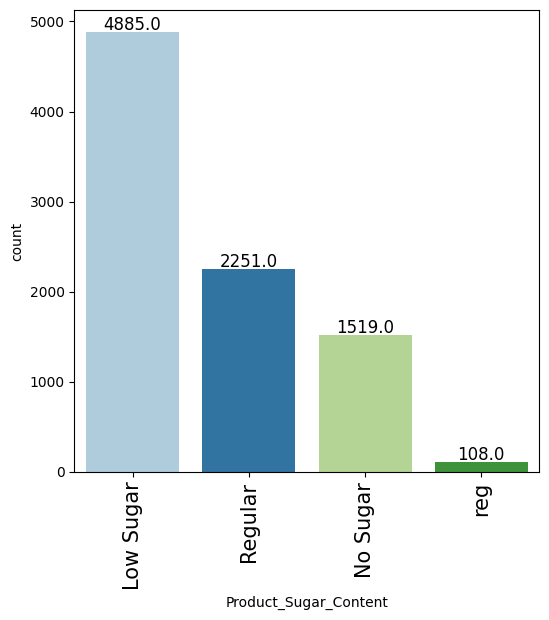

----------------------------------------------------------------------------------------------------


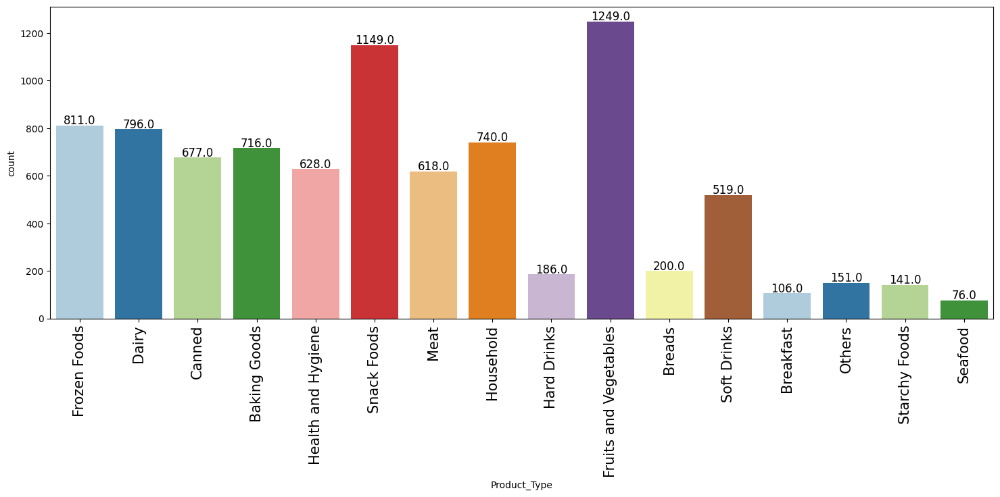

----------------------------------------------------------------------------------------------------


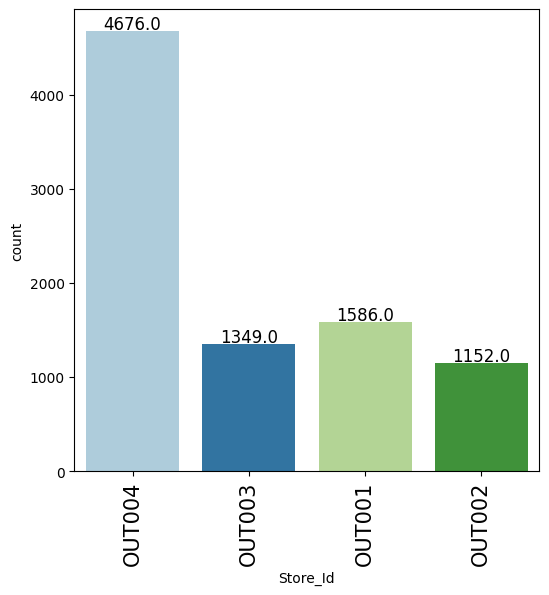

----------------------------------------------------------------------------------------------------


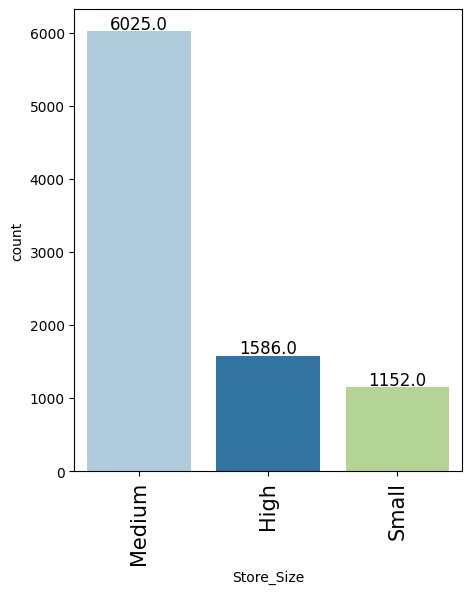

----------------------------------------------------------------------------------------------------


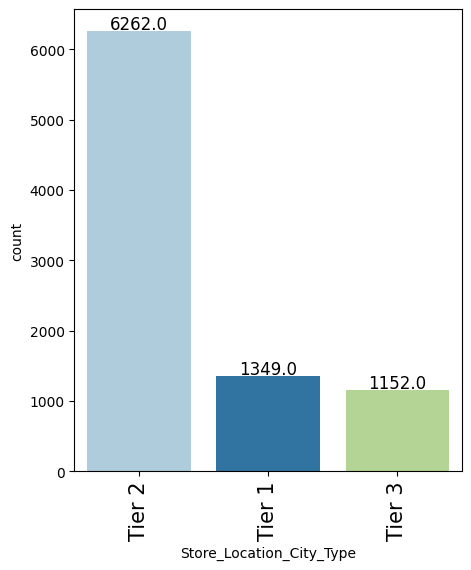

----------------------------------------------------------------------------------------------------


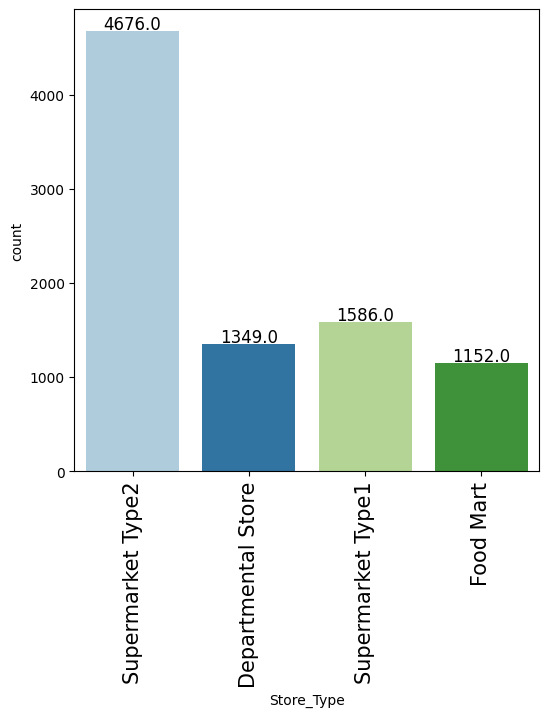

----------------------------------------------------------------------------------------------------


,number of rows,number of columns,number of missing values,number of duplicates
0,8763,12,0,0


----------------------------------------------------------------------------------------------------


,number of rows,number of columns,number of missing values,number of duplicates
0,8763,12,0,0


In [4]:
#Overview of entire dataset
EDA.overview(data=superKart,printall=True)

🔎  **OBSERVATION:**

- There does not seem to be any noteworthy data observations or any missing data in the 1st 5 rows.
- `Product_Id` seems to start with a prefix. I'll review that later as I determine any potential transformation prior to model building.

🔎  **OBSERVATION:**

- There does not seem to be any noteworthy data observations or any missing data in the last 5 rows either.

🔎  **OBSERVATION:**

- There does not seem to be any nulls or missing data in the dataset. There are 8763 non-null values for each data element or feature.
- *Product_Sugar_Content*, *Product_Type*, *cleaning_fee*, *Store_Size*, *Store_Size*, *Store_Location_City_Type*, and *Store_Type* are categorical-type variables.
- All other variables are numerical in nature.

🔎  **OBSERVATION:**

- There does not seem to be any duplicated data in the dataset.

In [5]:
# Count the number of unique values in each column
display(superKart.nunique())
# checking unique values for Product_Sugar_Content
display(superKart['Product_Sugar_Content'].unique())

Product_Id                   8763
Product_Weight               1113
Product_Sugar_Content           4
Product_Allocated_Area        228
Product_Type                   16
Product_MRP                  6100
Store_Id                        4
Store_Establishment_Year        4
Store_Size                      3
Store_Location_City_Type        3
Store_Type                      4
Product_Store_Sales_Total    8668
dtype: int64

<ArrowStringArray>
['Low Sugar', 'Regular', 'No Sugar', 'reg']
Length: 4, dtype: str

🔎  **OBSERVATION:**

- From the above, I can see there is probably a data labeling error because `Product_Sugar_Content` shows 4 unique values instead of 3 per the data description above.
- I am fairly certain The Value `Regular` should be the same as `Reg` which has 108 values.
- I'll correct this before I begin EDA Analysis.

## Data Cleansing for Product_Sugar_Content Prior to EDA

In [6]:
# Standardize inconsistent category labels
print("Before cleanup:", superKart['Product_Sugar_Content'].value_counts(dropna=False))
superKart['Product_Sugar_Content'] = superKart['Product_Sugar_Content'].replace({'Reg': 'Regular', 'reg': 'Regular'})
print("After cleanup:", superKart['Product_Sugar_Content'].value_counts(dropna=False))

Before cleanup: Product_Sugar_Content
Low Sugar    4885
Regular      2251
No Sugar     1519
reg           108
Name: count, dtype: int64
After cleanup: Product_Sugar_Content
Low Sugar    4885
Regular      2359
No Sugar     1519
Name: count, dtype: int64


🔎  **OBSERVATION:**

- From the above, I can see I have now normalized the date for  `Product_Sugar_Content`. ('Reg': 'Regular', 'reg': 'Regular')

## Value Counts for Categorical Features
Understanding the distribution of values in categorical features helps detect imbalance and informs your encoding strategy.

In [7]:
# Identify categorical columns based on object dtype
categorical_cols = superKart.select_dtypes(include='object').columns

# Display value counts for each categorical column
for col in categorical_cols:
    print(f"\nValue counts for '{col}':\n")
    print(superKart[col].value_counts())


Value counts for 'Product_Id':

Product_Id
FD6114    1
FD7839    1
FD5075    1
FD8233    1
NC1180    1
         ..
NC7546    1
NC584     1
NC2471    1
NC7187    1
FD306     1
Name: count, Length: 8763, dtype: int64

Value counts for 'Product_Sugar_Content':

Product_Sugar_Content
Low Sugar    4885
Regular      2359
No Sugar     1519
Name: count, dtype: int64

Value counts for 'Product_Type':

Product_Type
Fruits and Vegetables    1249
Snack Foods              1149
Frozen Foods              811
Dairy                     796
Household                 740
Baking Goods              716
Canned                    677
Health and Hygiene        628
Meat                      618
Soft Drinks               519
Breads                    200
Hard Drinks               186
Others                    151
Starchy Foods             141
Breakfast                 106
Seafood                    76
Name: count, dtype: int64

Value counts for 'Store_Id':

Store_Id
OUT004    4676
OUT001    1586
OUT003    1349

🔎  **OBSERVATION:**

- Some of the columns values appear to be slightly imbalanced. I'll have to review distribution further during the EDA process.

🔎  **OBSERVATION:**

- There does not seem to be any noteworthy items in the current dataset. Non. numerical columns are showing NaN (Not a Number) for std, mean, min, etc. as expected.

# Exploratory Data Analysis (EDA)

Purpose:

Define the target variable and select relevant numerical and categorical predictors for the regression model.

We exclude `Product_Id` and `Store_Id` since they are unique identifiers that do not contribute predictive value.

In [8]:
# Define the target variable for prediction
target = 'Product_Store_Sales_Total'

# Manually selected numerical features (excluding identifier columns)
numeric_features = [
    'Product_Weight',
    'Product_Allocated_Area',
    'Product_MRP',
    'Store_Establishment_Year'  # Will transform to Store_Age later
]

# Manually selected categorical features based on domain knowledge
categorical_features = [
    'Product_Sugar_Content',
    'Product_Type',
    'Store_Size',
    'Store_Location_City_Type',
    'Store_Type'
]

### Univariate Analysis — Numerical Features

Purpose:

Analyze the distribution and presence of outliers in each numerical feature using histograms and boxplots.

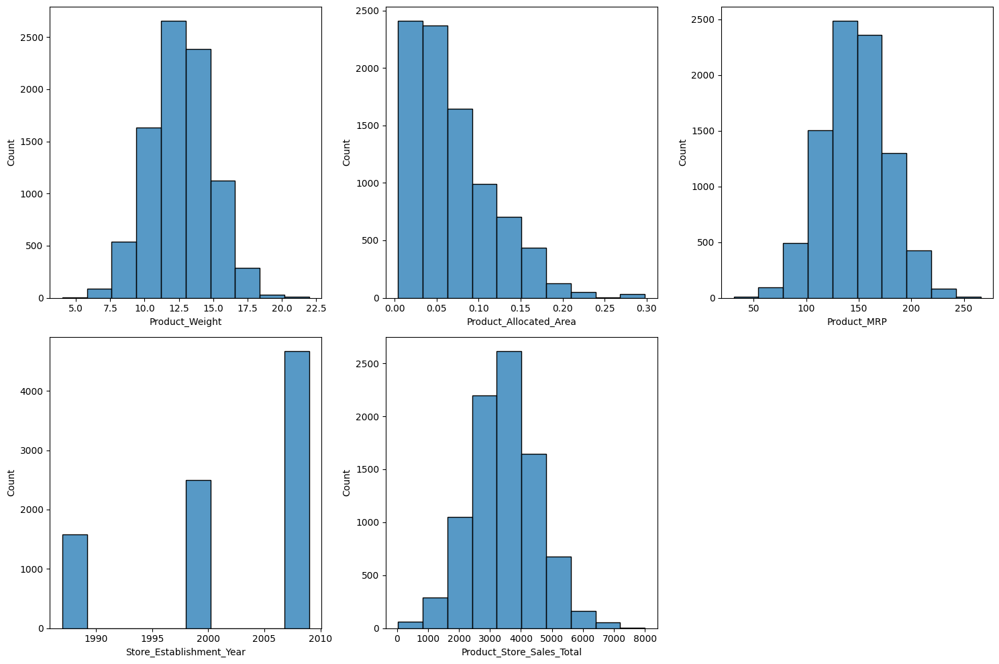

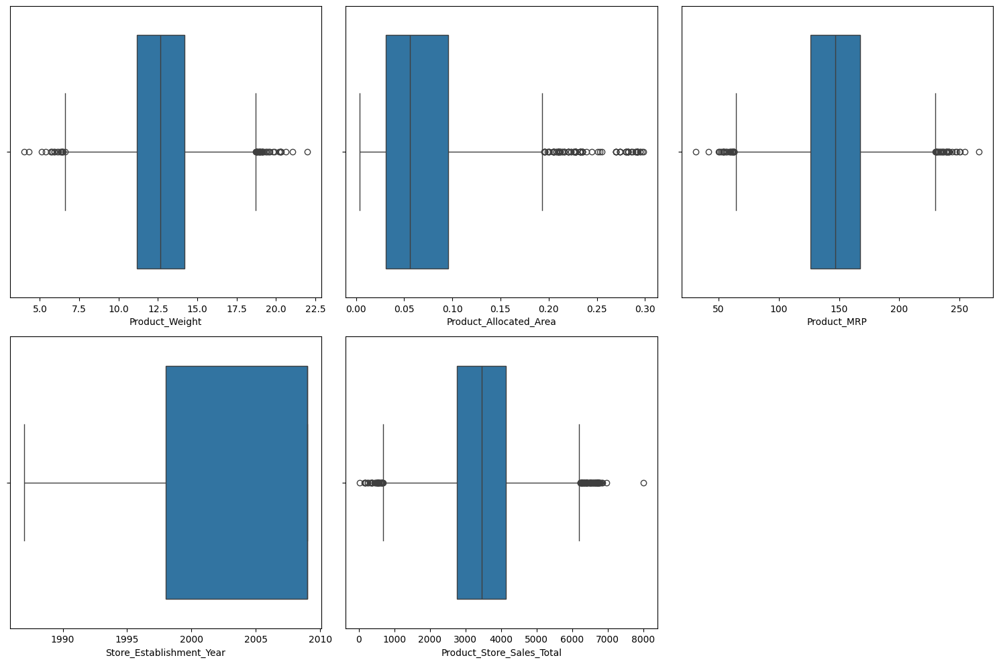

In [9]:
EDA.histogram_boxplot_all(data=superKart)

🔎  **OBSERVATION:**

- The distribution of `Product_Weight` appears relatively uniform, with no significant skewness or heavy tails. The boxplot does not indicate the presence of extreme outliers, suggesting this feature is clean and well-behaved for modeling.

🔎  **OBSERVATION:**

- The distribution of `Product_Allocated_Area` is right-skewed, with most values concentrated near the lower end of the scale. The long tail and presence of outliers beyond the 75th percentile suggest that a small subset of products are allocated significantly larger shelf areas. This may be expected for high-demand or bulkier items, indicating a potential business-driven allocation strategy. These outliers are likely valid and informative rather than erroneous.

🔎  **OBSERVATION:**

- The `Product_MRP` (Maximum Retail Price) distribution appears relatively uniform, with no significant skewness. The boxplot reveals no extreme outliers, indicating consistent pricing across the product range.

🔎  **OBSERVATION:**

- The distribution of `Store_Establishment_Year` is left-skewed, with most values concentrated toward more recent years (post-2009). The long tail on the left suggests a few older stores established prior to that time. Given that there are only four unique Store IDs in the dataset, the presence of clustered establishment years may point to one or more high-volume flagship stores, particularly those established around 2009.

### Univariate Analysis — Categorical Features

Purpose:

To understand the distribution of each categorical variable. This helps identify potential class imbalance, which could impact model training and encoding strategies. We'll use countplot for visualization and display frequency counts.

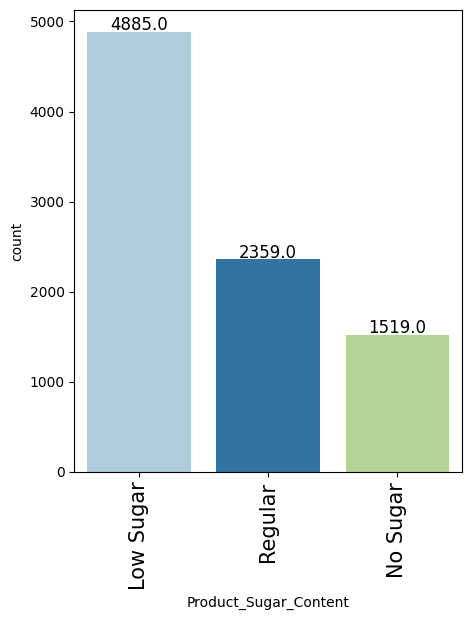

----------------------------------------------------------------------------------------------------


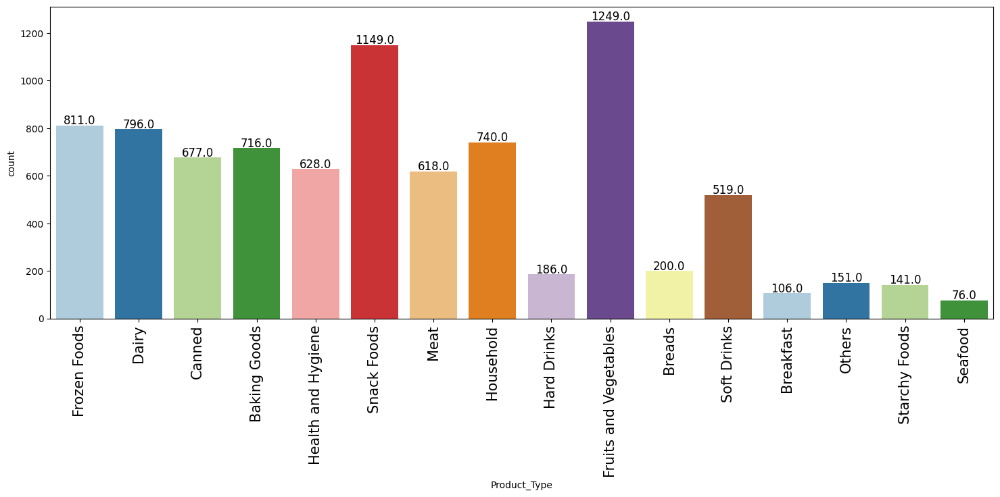

----------------------------------------------------------------------------------------------------


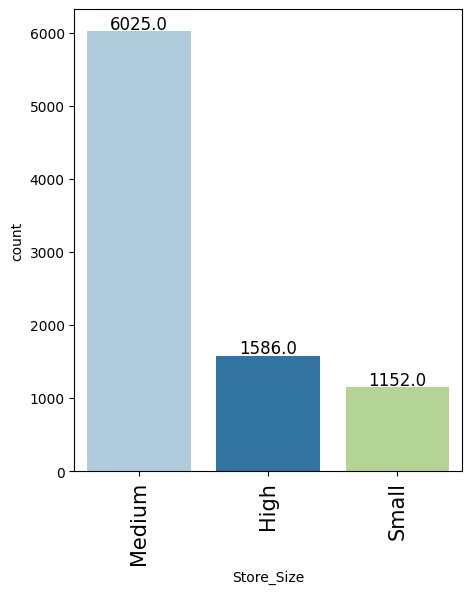

----------------------------------------------------------------------------------------------------


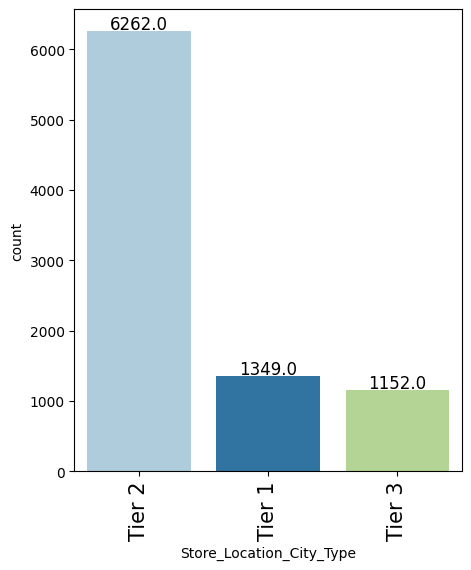

----------------------------------------------------------------------------------------------------


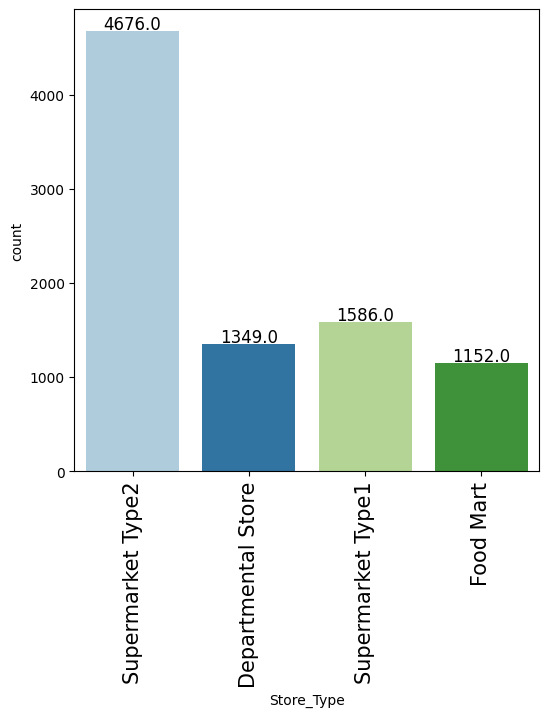

----------------------------------------------------------------------------------------------------


In [10]:
EDA.barplot_labeled_all(data=superKart,predictors=categorical_features,target=target)

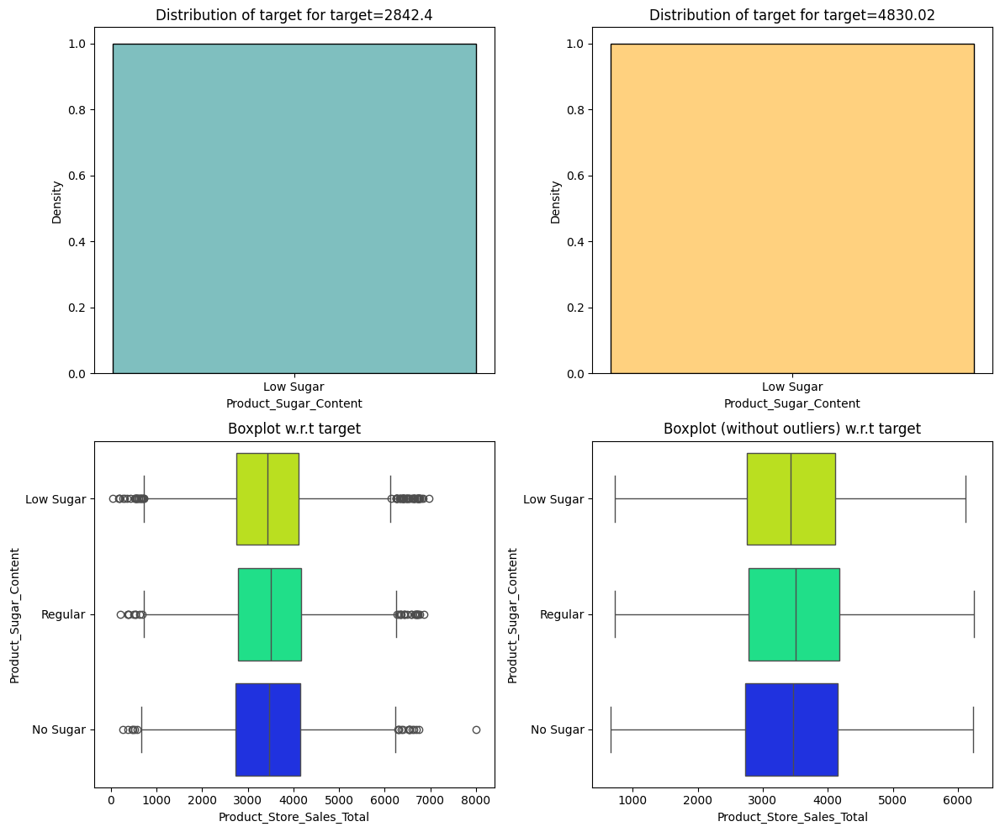

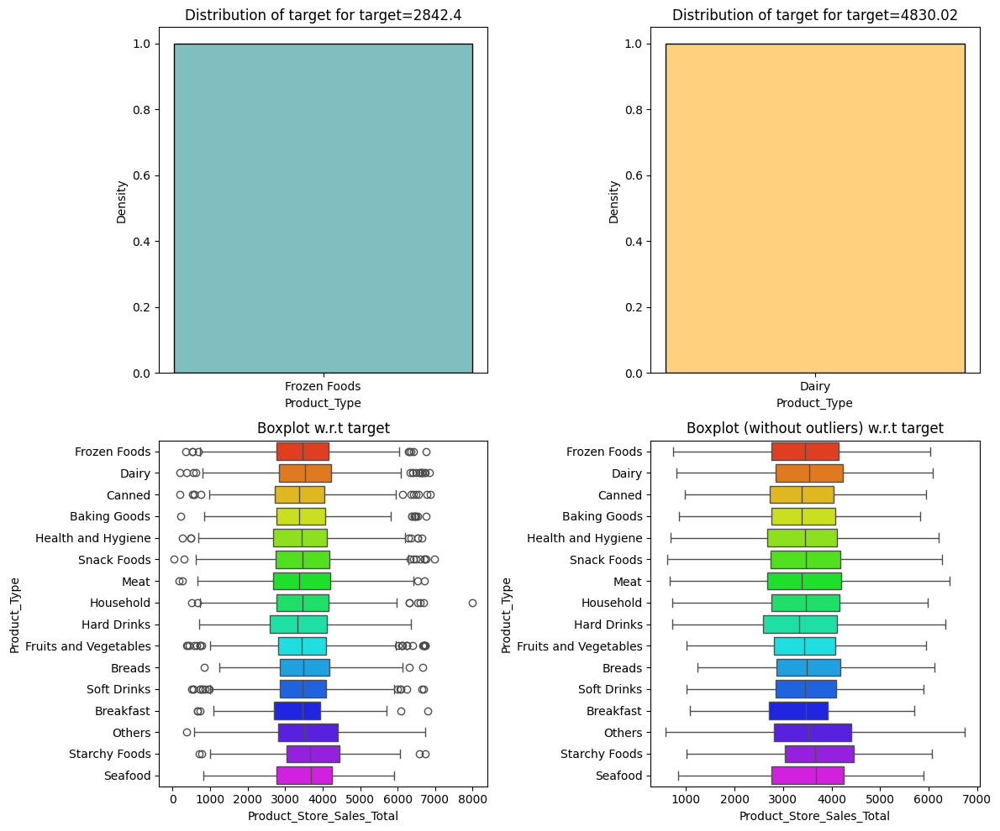

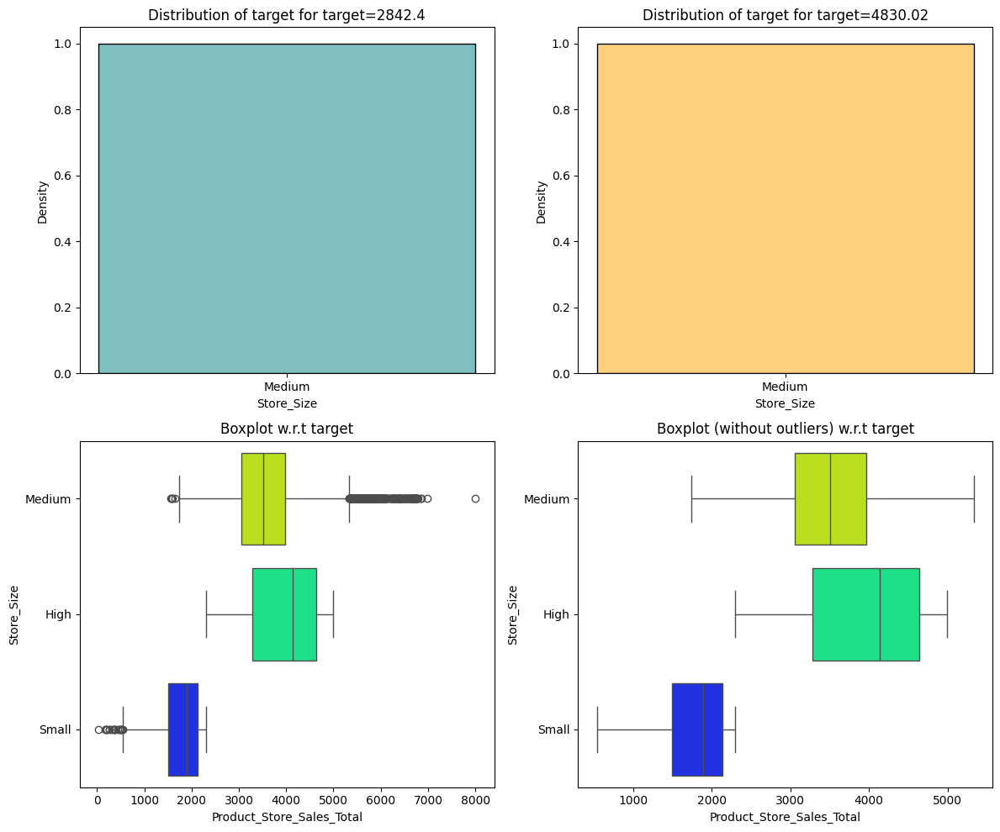

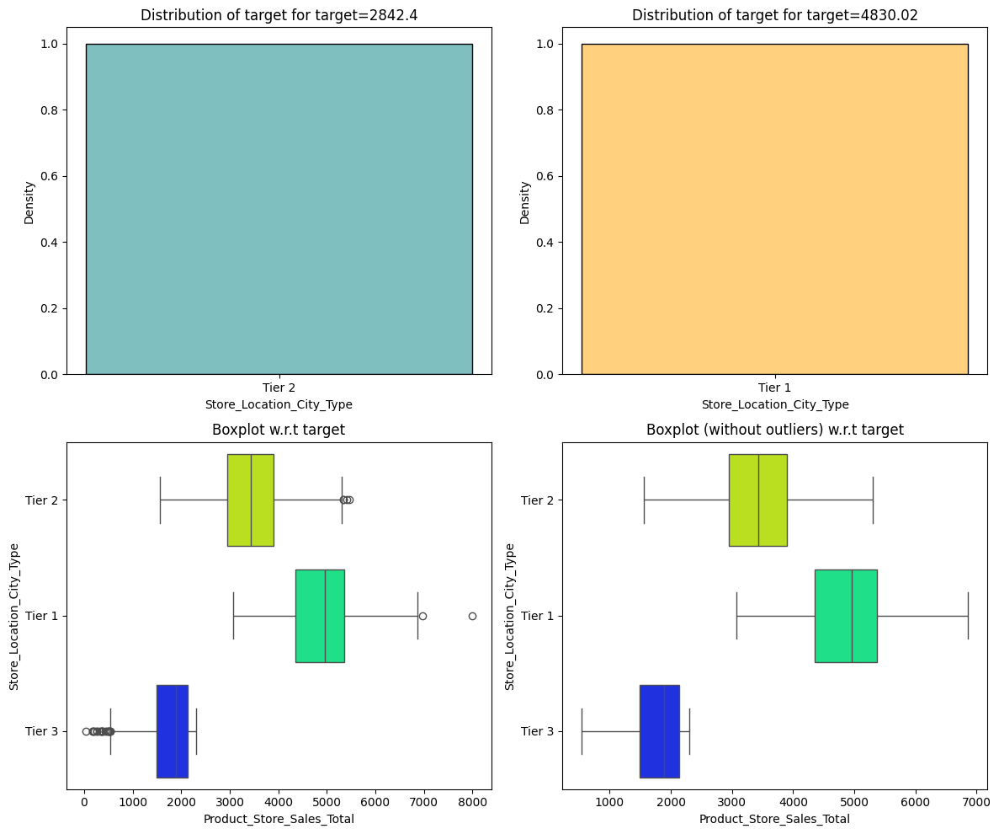

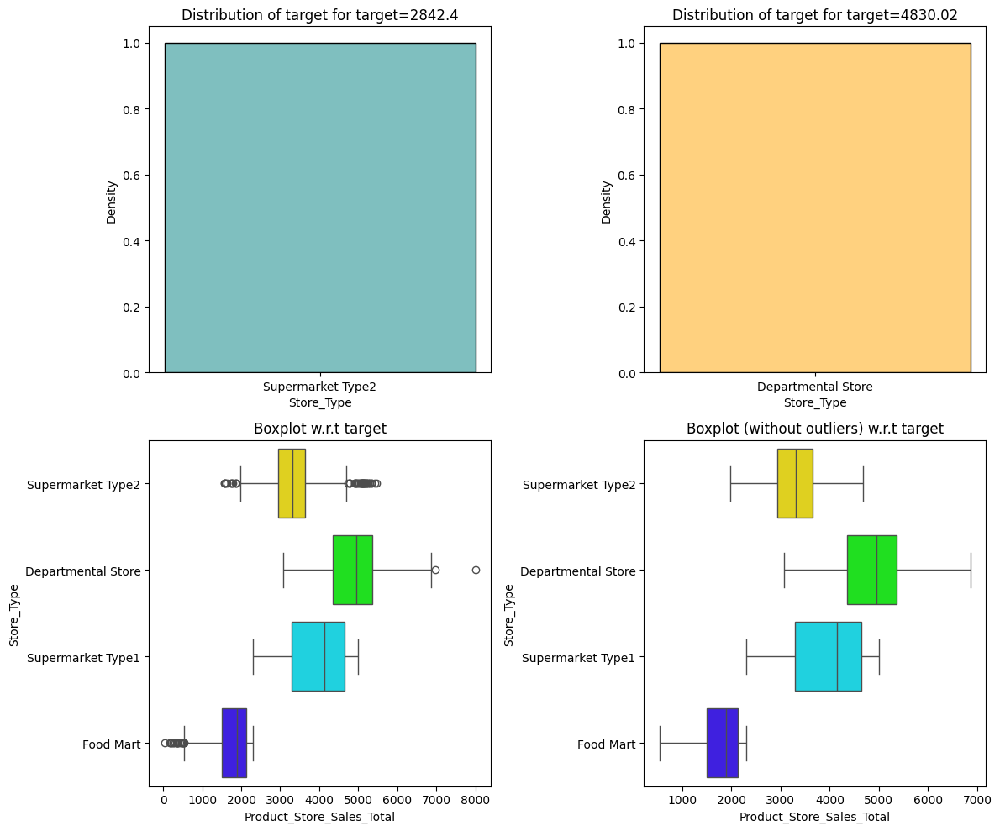

----------------------------------------------------------------------------------------------------


In [11]:
EDA.distribution_plot_for_target_all(data=superKart,target=target, predictors=categorical_features )

🔎  **OBSERVATION: Product_Sugar_Content**

- The majority of products fall under the 'Low Sugar' category, with 'Regular' and 'No Sugar' appearing much less frequently. The distribution appears clean and normalized, with no anomalies or unexpected values.

🔎  **OBSERVATION:Product_Type**

**Top categories:**

- **Fruits and Vegetables**, **Snack Foods**, and **Frozen Foods** have the highest counts, suggesting they are SuperKart's most common product categories.

**Bottom categories:**

- **Seafood**, **Breakfast**, and **Starchy Foods** are less common, possibly due to limited demand or shelf life.

The distribution appears reasonably balanced across most categories, but the top few dominate the inventory.

🔎  **OBSERVATION: Store_Size**

- Medium stores are by far the most common, with 6,025 entries.

- High stores are less frequent at 1,586 entries.

- Small stores are the least represented with 1,152 entries.

- This imbalance may reflect SuperKart's business model — possibly a greater reliance on medium-sized store formats. It's not a data issue, but it's worth considering for possible class imbalance for modeling.

🔎  **OBSERVATION:Store_Location_City_Type**

- The majority of stores are located in Tier 2 cities, with 6262 entries.

- Tier 1 and Tier 3 cities are much less represented, with only 1349 and 1152 entries respectively.

This suggests SuperKart's operations are heavily concentrated in mid-sized urban centers (Tier 2).

🔎  **OBSERVATION:Store_Type**

The majority of stores are Supermarket Type2 (4676 records), followed by:

- Supermarket Type1 (1586)

- Departmental Store (1349)

- Food Mart (1152)

This distribution shows a class imbalance, which could influence model behavior if this variable has predictive power.

## Bivariate Analysis
Let's start with a correlation heatmap matrix

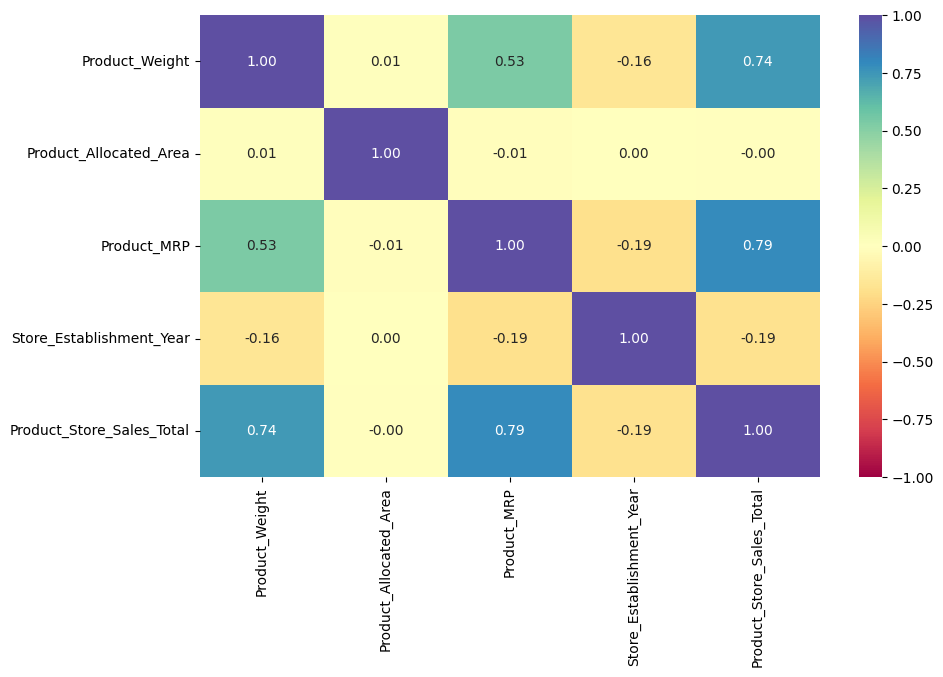

In [12]:
EDA.heatmap_all(data=superKart,figsize=(10, 6))

🔎  **OBSERVATION:**

The correlation matrix reveals two features with strong positive correlations to our target variable **Product_Store_Sales_Total**:

- **Product_MRP** (correlation ≈ 0.79): This is expected — products with higher maximum retail prices will naturally generate higher total sales, assuming similar sales volumes.

- **Product_Weight** (correlation ≈ 0.74): Heavier products may represent bulkier or premium items that command higher prices, which could explain their strong correlation with total sales.

Interestingly, **Product_Allocated_Area** has almost no correlation with total sales. This suggests that floor space allocation alone isn't a reliable predictor of sales performance.

### Visualizing Relationships Between Numeric Features and Sales

Purpose:

To better understand which numerical features drive product-store sales, we'll use scatterplots comparing each numeric variable to the target **Product_Store_Sales_Total**.

#### Numerical features in the dataset 
- Product_Weight,            # Weight of the product
- Product_Allocated_Area,    # Shelf space allocated in the store
- Product_MRP,               # Maximum Retail Price
- Store_Establishment_Year   # Year the store was established

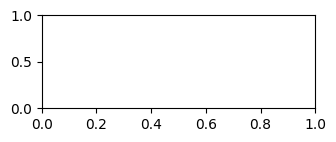

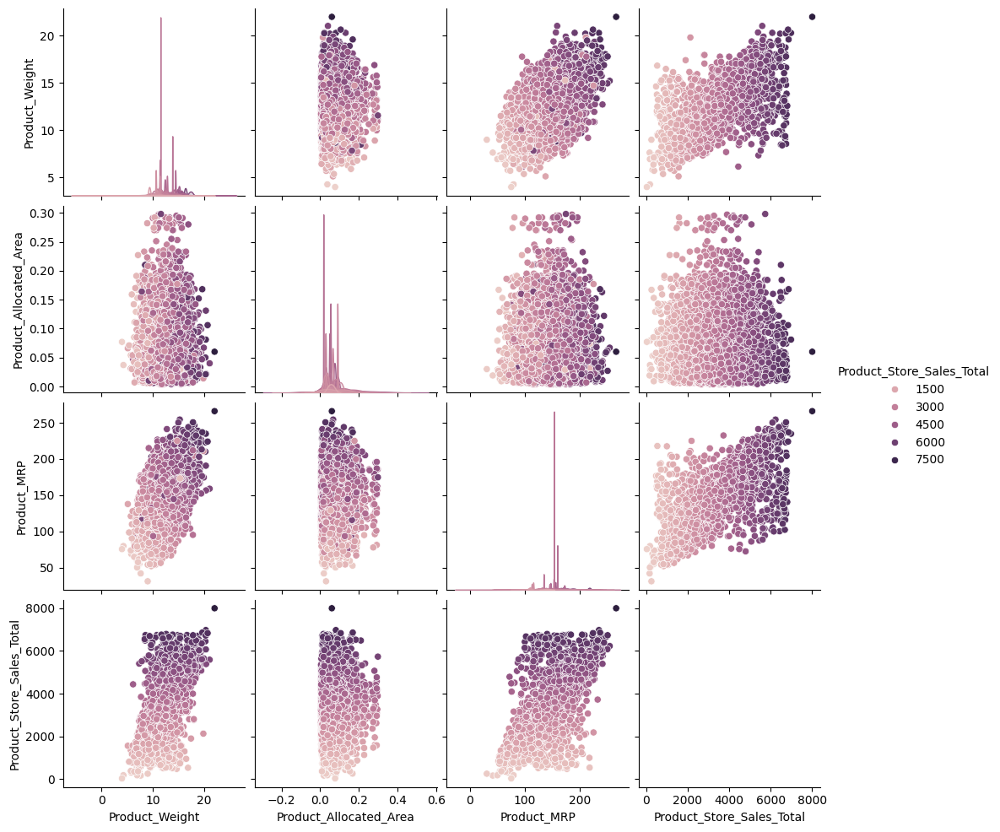

----------------------------------------------------------------------------------------------------


In [13]:
EDA.pairplot_all(data=superKart,hues=[target])


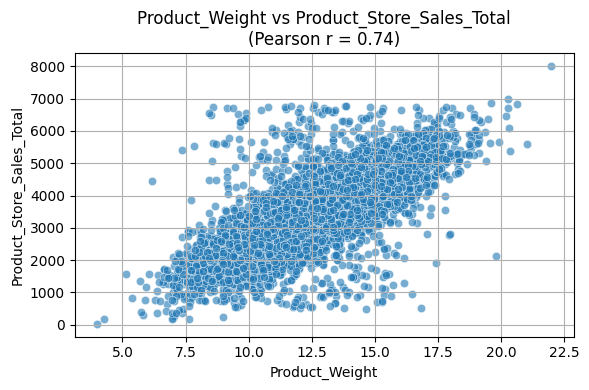

----------------------------------------------------------------------------------------------------


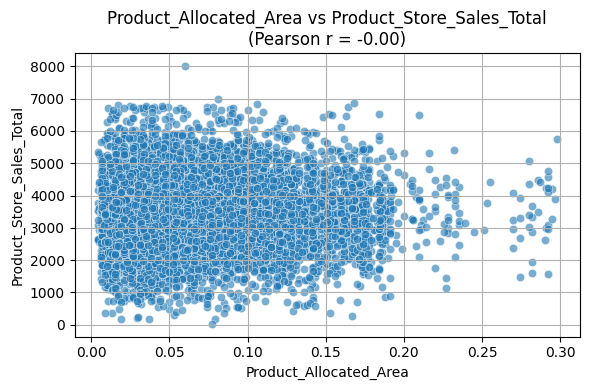

----------------------------------------------------------------------------------------------------


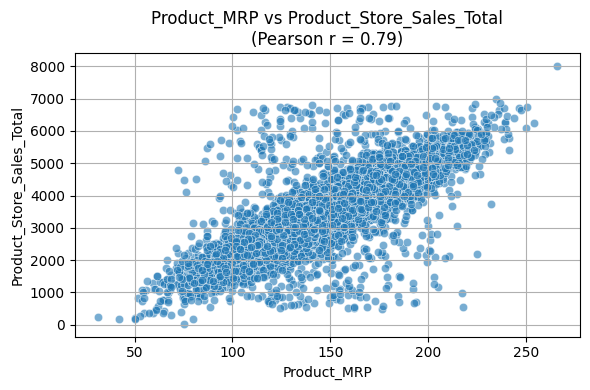

----------------------------------------------------------------------------------------------------


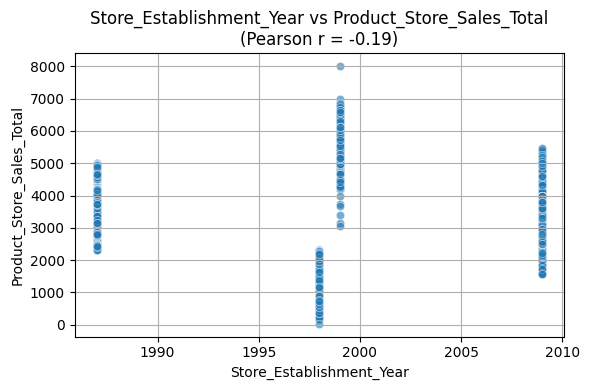

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


In [14]:
EDA.scattterplot_all(data=superKart, target=target)

🔎  **OBSERVATION:Product_Store_Sales_Total**

**Product_Weight** has a strong positive linear correlation with **Product_Store_Sales_Total** (r ≈ 0.74). This suggests that heavier products tend to generate higher sales — potentially due to their larger size, premium packaging, or greater volume, which could command higher retail prices.

🔎  **OBSERVATION:Product_Allocated_Area**

- Based on the scatterplot above we see a low correlation with `Product_Allocated_Area`.
- The Pearson coefficien is 0.00 but this may be due to skewed data with lots of outliers as we saw in the boxplot higher up in the notebook.

🔎  **OBSERVATION:Product_MRP**

- **Product_MRP** shows a strong positive correlation with **Product_Store_Sales_Total** (Pearson r ≈ 0.76). This is expected — as the unit price of a product increases, total revenue also increases assuming consistent or growing sales volume.

- The upward trend is quite clear, suggesting that pricing is a dominant driver of total sales. This makes **Product_MRP** a key feature in the model and a strong predictor of revenue.

🔎  **OBSERVATION:Store_Establishment_Year**

- There appears to be no strong linear relationship between Store_Establishment_Year and Product_Store_Sales_Total (Pearson r = -0.19). The data points are spread out with no clear trend. This suggests that the age of the store, by itself, is not a major driver of monthly product-store sales.

- It's possible that newer and older stores both perform well depending on location, product mix, and store type — all of which may matter more than the year the store was founded.

### Distribution of our target variable against categorical variables for additional insight.

- Visualize how the average monthly sales vary across different categories. We'll use boxplots and barplots to compare mean sales for each category in:


- 'Product_Sugar_Content',      # sugar content of each product like low sugar, regular and no sugar
- 'Product_Type',               # broad category for each product like meat, snack foods              
- 'Store_Size',                 # size of the store depending on sq. feet like high, medium and low                 
- 'Store_Location_City_Type',   # type of city in which the store is located like Tier 1, Tier 2   
- 'Store_Type'                  # type of store depending on the products that are being sold there like Departmental Store, Supermarket Type 1

#### Utility function for our Boxplots and Barplots for our categorical features

In [15]:
# Define a utility function to graph categorical values using barplots.
def plot_categorical_insights(df, cat_col, target='Product_Store_Sales_Total'):
    """
    Display a boxplot followed by a barplot for a categorical feature against the target variable.

    Parameters:
    - df (DataFrame): The dataset
    - cat_col (str): The name of the categorical column
    - target (str): The target variable to analyze
    """

    # Barplot (Mean Aggregation)
    plt.figure(figsize=(10, 5))
    mean_values = df.groupby(cat_col)[target].mean().sort_values(ascending=False)
    sns.barplot(x=mean_values.index, y=mean_values.values)
    plt.title(f'Average {target} by {cat_col} (Barplot)')
    plt.ylabel(f'Mean {target}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Spacer
    print("\n")  # adds a blank line in output

    # Boxplot
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=cat_col, y=target, data=df)
    plt.title(f'Distribution of {target} by {cat_col} (Boxplot)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


#### Store Types that drive Highest Sales Revenue

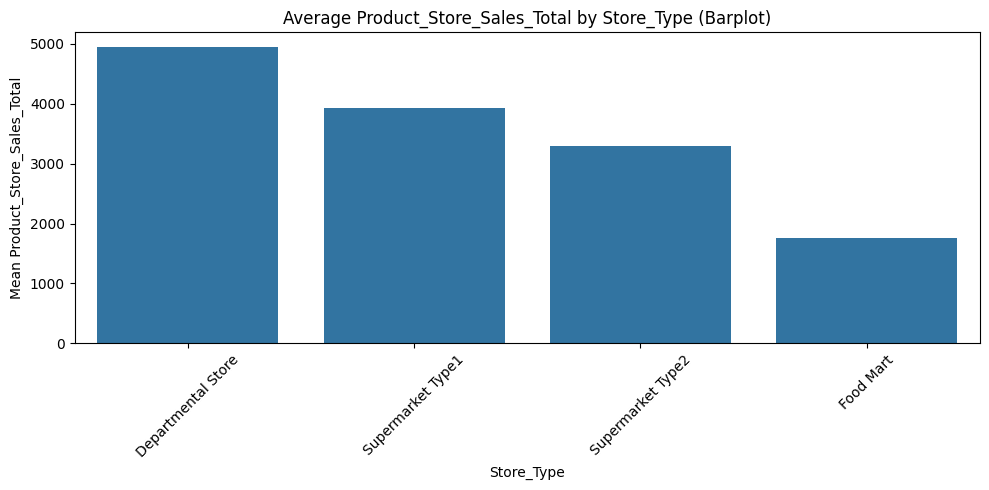

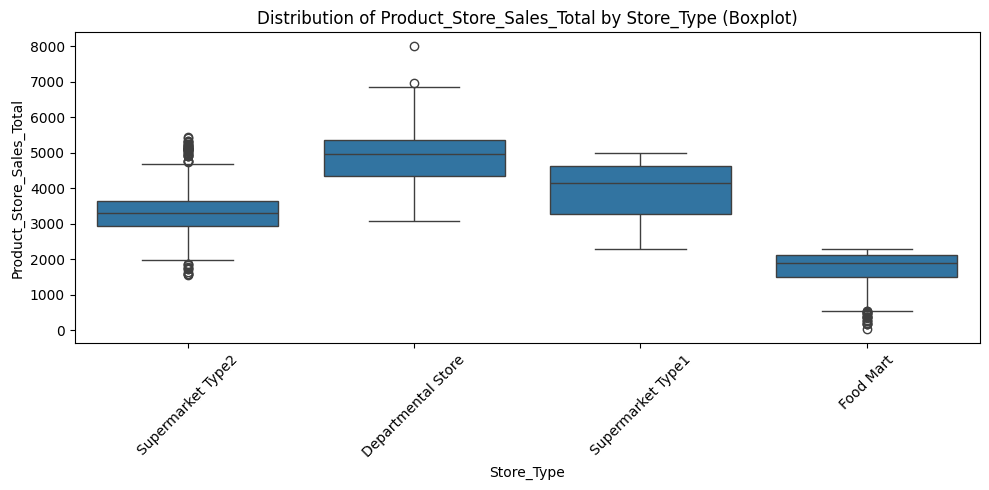

In [16]:
# Display barplot and boxplot of our target against `Store_Type`
plot_categorical_insights(superKart, 'Store_Type')

🔎  **OBSERVATION:**

- Based on the above barplot we can see Department stores generate the most revenue and Food Marts generate the least. The Food Mart makes sense as this is probably a much smaller store relative to the others.
- Based on the Boxplot we can see that the Department stores mean store sales about 20% higher than it's next store type which is Supermarket Type1.
- `Store_Type` could be a strong feature in our model due to its clear impact on sales

#### Store Sizes that drive the Highest Sales Revenue

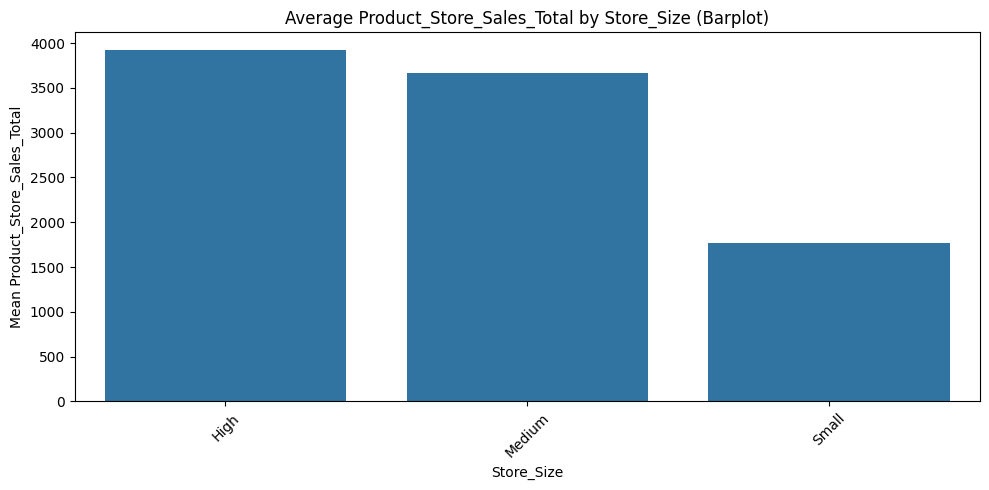

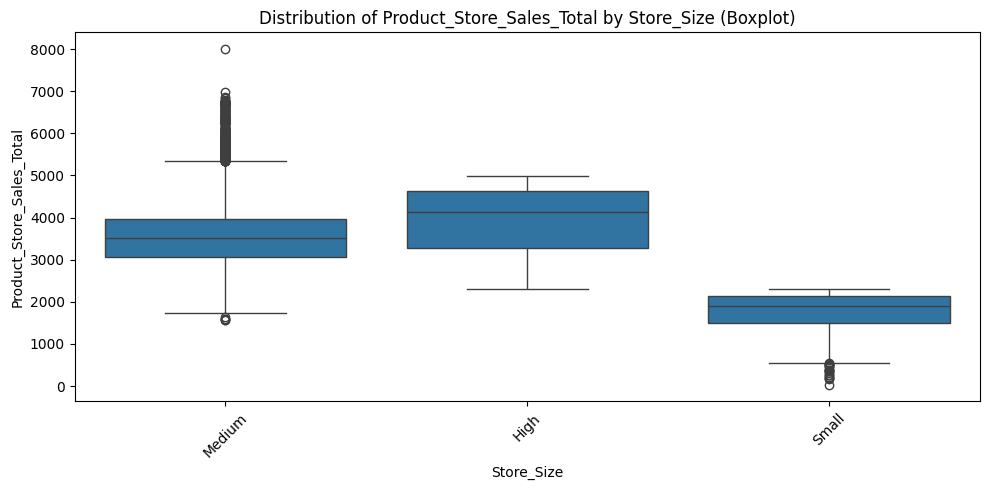

In [17]:
# Display barplot and boxplot of our target against `Store_Size`
plot_categorical_insights(superKart, 'Store_Size')

🔎  **OBSERVATION:**

- Based on the above barplot we can see larger stores generate the most revenue and smaller store types generate the least. This makes sense.
- `Store_Size` could be a strong feature in our model due to its clear impact on sales

#### Store Location City Types that drive the Highest Sales Revenue

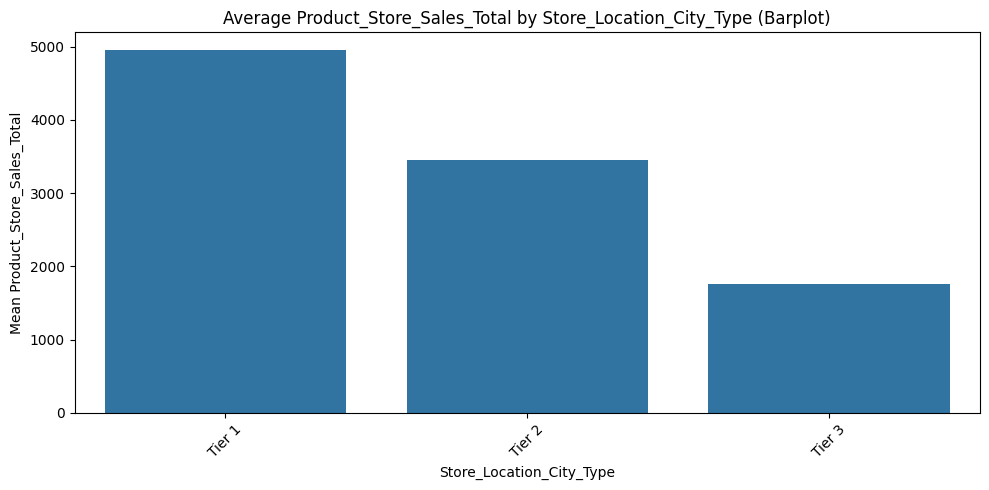

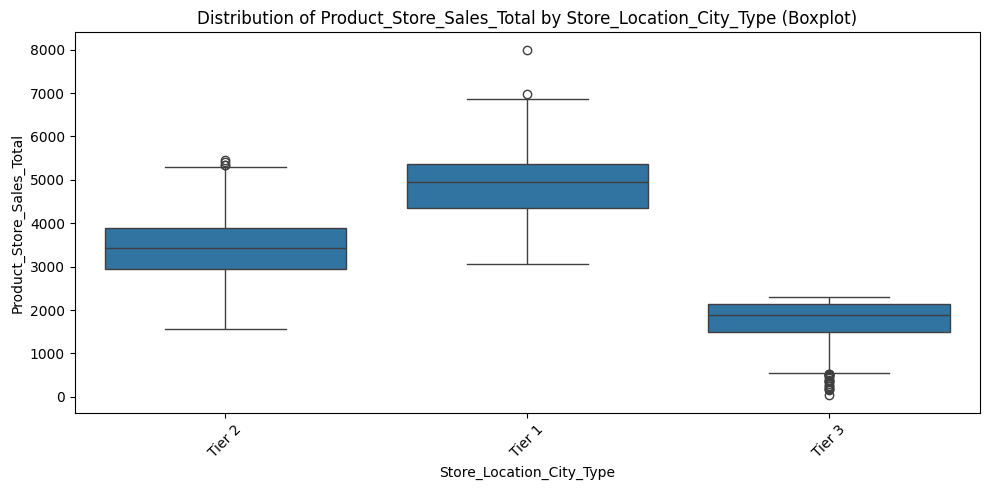

In [18]:
# Display barplot and boxplot of our target against `Store_Location_City_Type`
plot_categorical_insights(superKart, 'Store_Location_City_Type')

🔎  **OBSERVATION:**

- Based on the above barplot we can see Tier 1 locations generate the most revenue and Tier 3 generate the least. This makes sense as Tier 1 locations may be larger urban atreas and contain a larger selection and volume of products.
- `Store_Location_City_Type` could be a strong feature in our model due to its clear impact on sales

#### Product Types that drive the Highest Sales Revenue

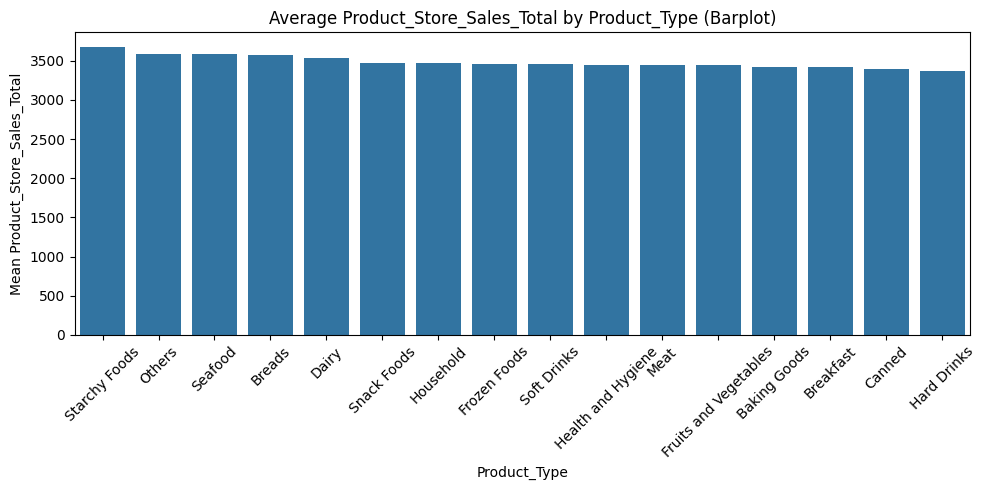

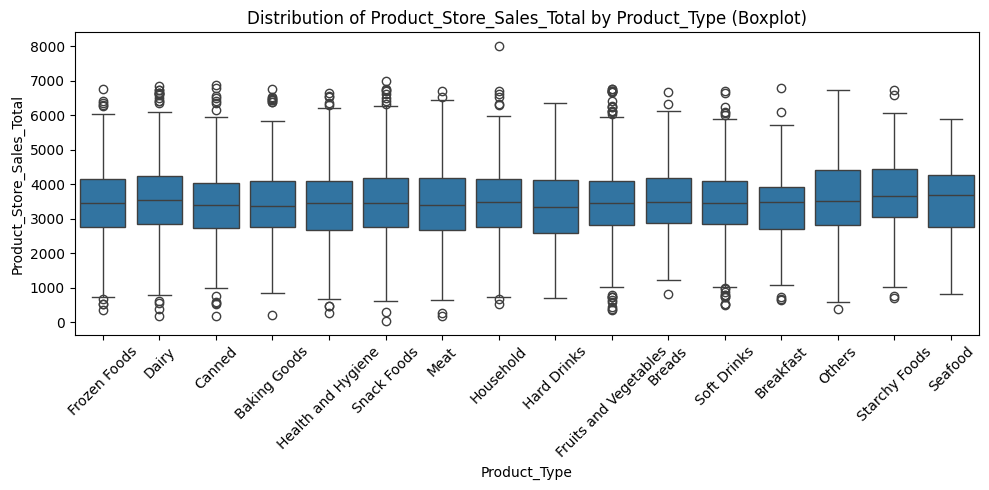

In [19]:
# Display barplot and boxplot of our target against `Product_Type`
plot_categorical_insights(superKart, 'Product_Type')

🔎  **OBSERVATION:**

- Interestingly, based on the above barplot and boxplots, most products are fairly evenly distributed and contribute fairly equally to overall total store sales, although Stachy Foods is slightly higher than the rest.
- `Product_Type` alone, may not be a strong feature in our model.

#### Product_Sugar_Content that drives Sales Revenue

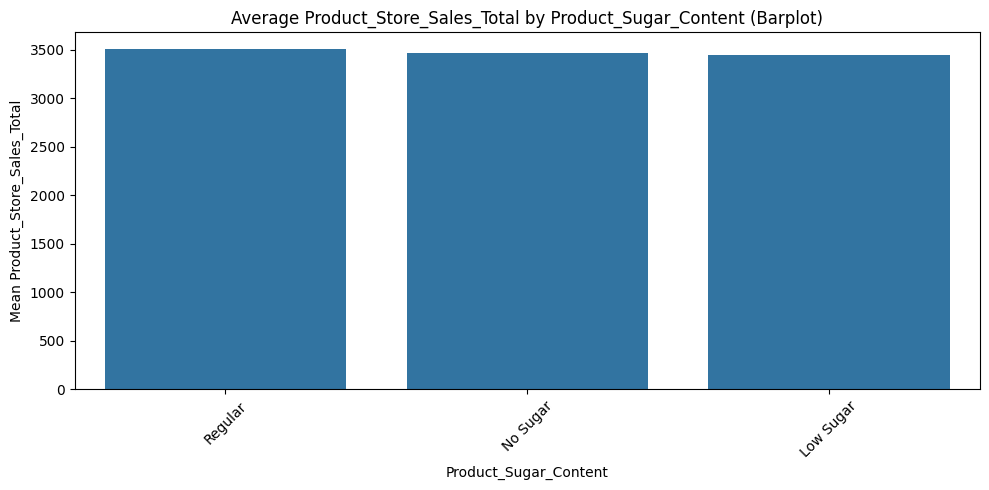

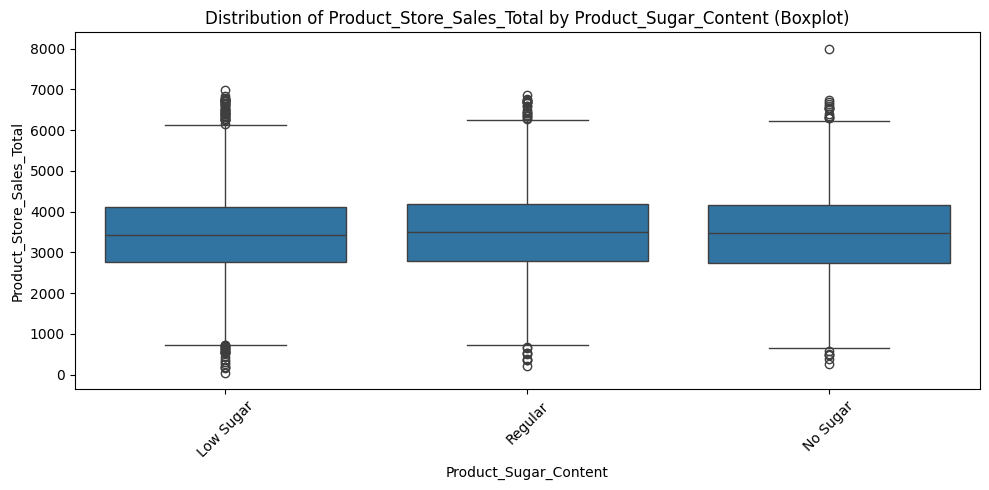

In [20]:
# Display barplot and boxplot of our target against `Product_Sugar_Content`
plot_categorical_insights(superKart, 'Product_Sugar_Content')

🔎  **OBSERVATION:**

- Similar to `Product_Type` based on the above barplot and boxplots, the categories are fairly evenly distributed and contribute fairly equally to overall total store sales.
- `Product_Sugar_Content` may not be a strong feature in our model.

#### Store that drives the Most Sales Revenue

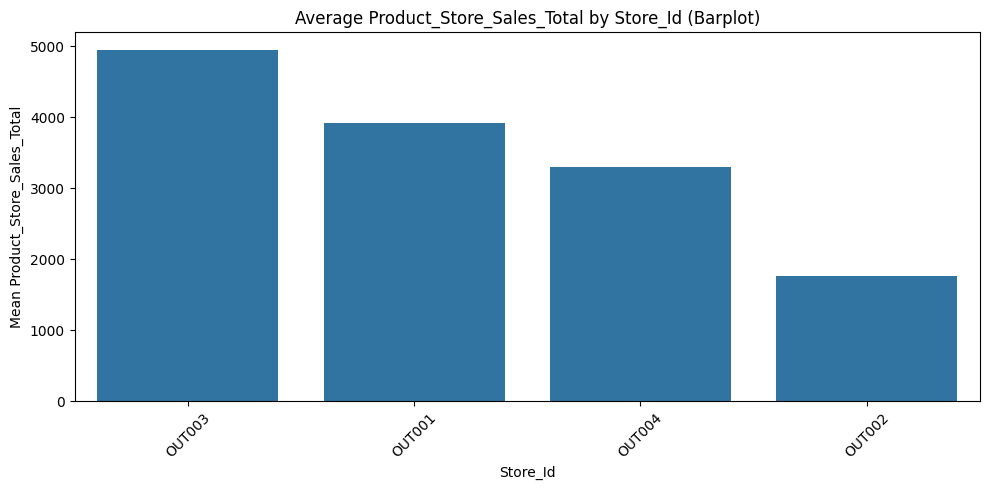

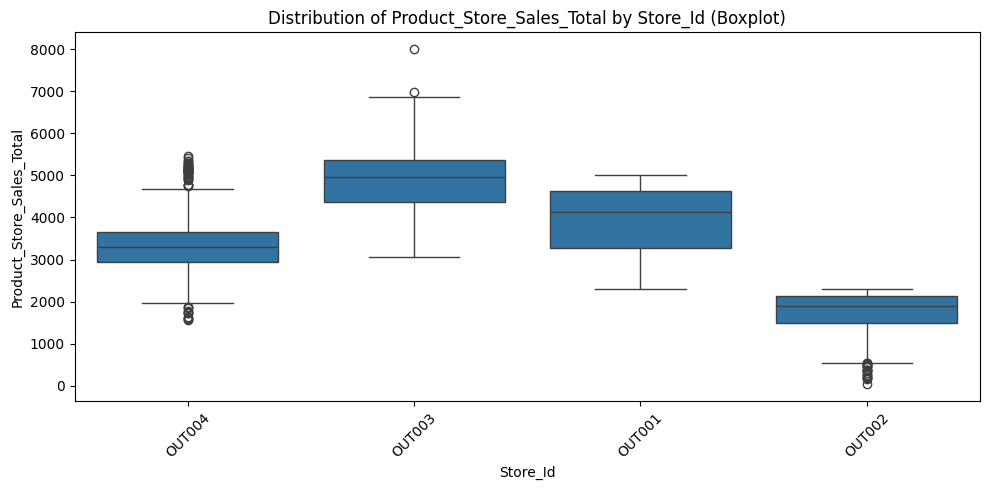

In [21]:
# Display barplot and boxplot of our target against `Store_Id`
plot_categorical_insights(superKart, 'Store_Id')

🔎  **OBSERVATION:**

- Based on the above Barplot and Boxplots, we can see **Store ID OUT003** drives the most revenue, followed by **OUT001**, **OUT004**, and finally **OUT002**.

#### Pivot Table all numeric fields

----------------------------------------------------------------------------------------------------


,mean,count,sum
,Product_Weight,Product_Weight,Product_Weight
Product_Store_Sales_Total,,,
33.00,4.00,1,4.00
166.92,7.64,1,7.64
180.86,6.95,1,6.95
183.02,4.28,1,4.28
203.55,7.02,1,7.02
...,...,...,...
6796.94,12.59,1,12.59
6835.81,20.65,1,20.65


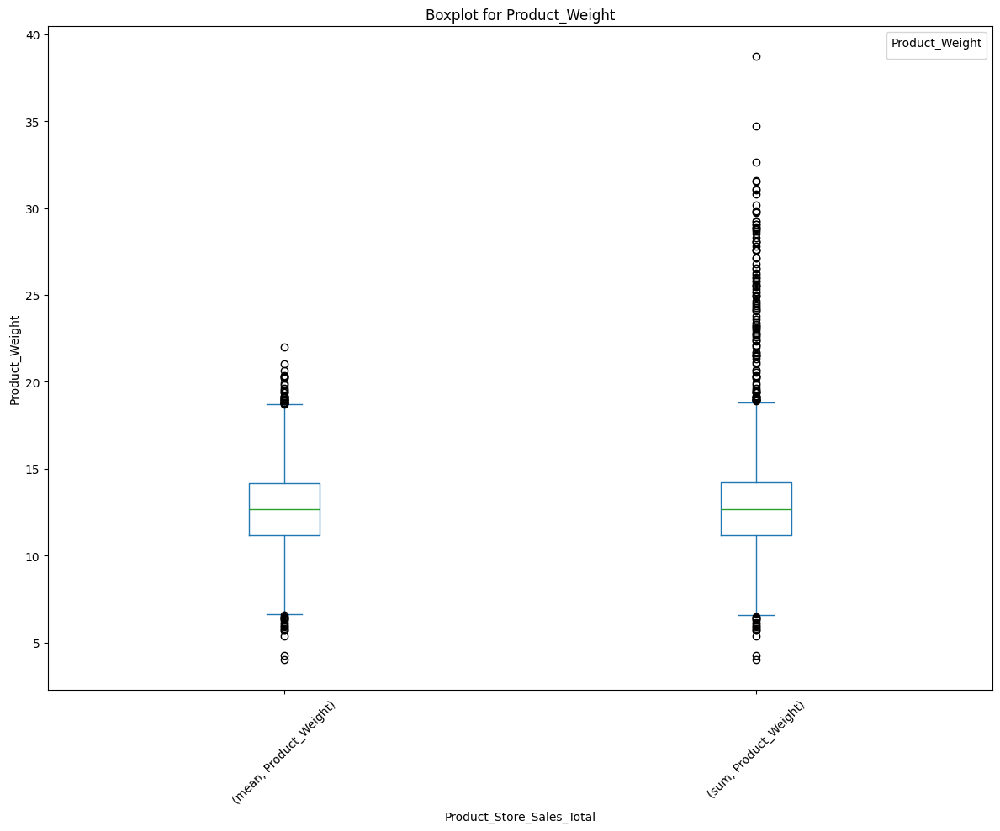

----------------------------------------------------------------------------------------------------


,mean,count,sum
,Product_Allocated_Area,Product_Allocated_Area,Product_Allocated_Area
Product_Store_Sales_Total,,,
33.00,0.077,1,0.077
166.92,0.019,1,0.019
180.86,0.079,1,0.079
183.02,0.037,1,0.037
203.55,0.029,1,0.029
...,...,...,...
6796.94,0.017,1,0.017
6835.81,0.106,1,0.106


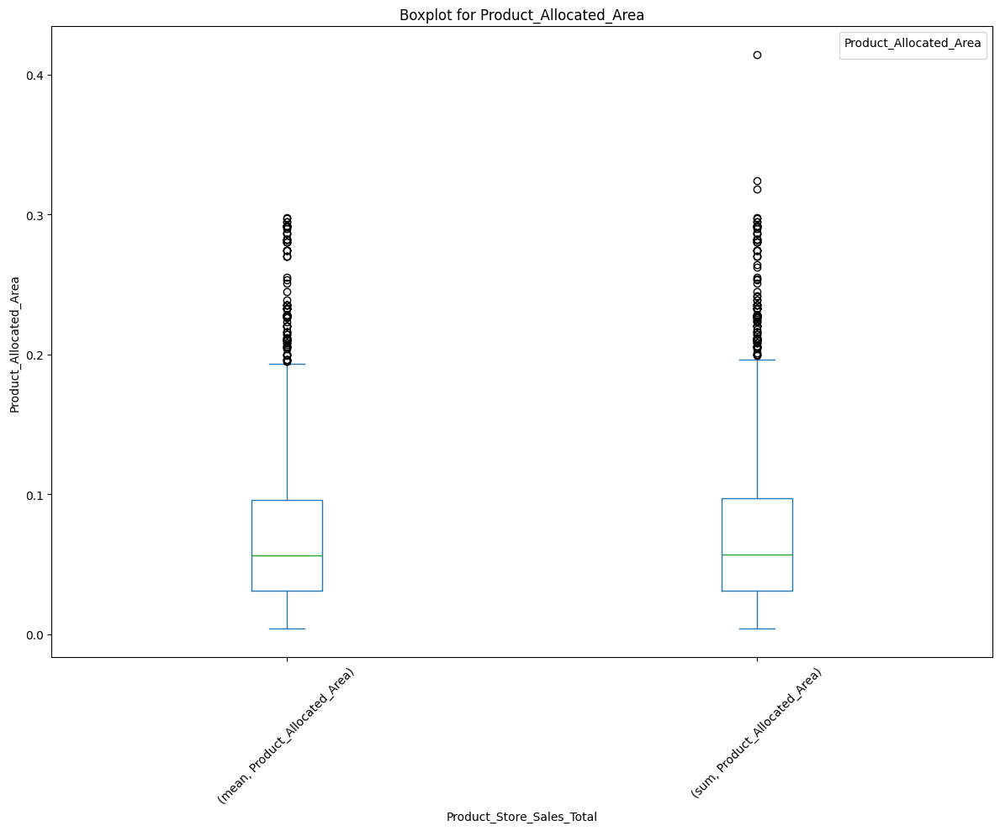

----------------------------------------------------------------------------------------------------


,mean,count,sum
,Product_MRP,Product_MRP,Product_MRP
Product_Store_Sales_Total,,,
33.00,75.44,1,75.44
166.92,41.84,1,41.84
180.86,50.13,1,50.13
183.02,79.65,1,79.65
203.55,50.42,1,50.42
...,...,...,...
6796.94,140.50,1,140.50
6835.81,223.98,1,223.98


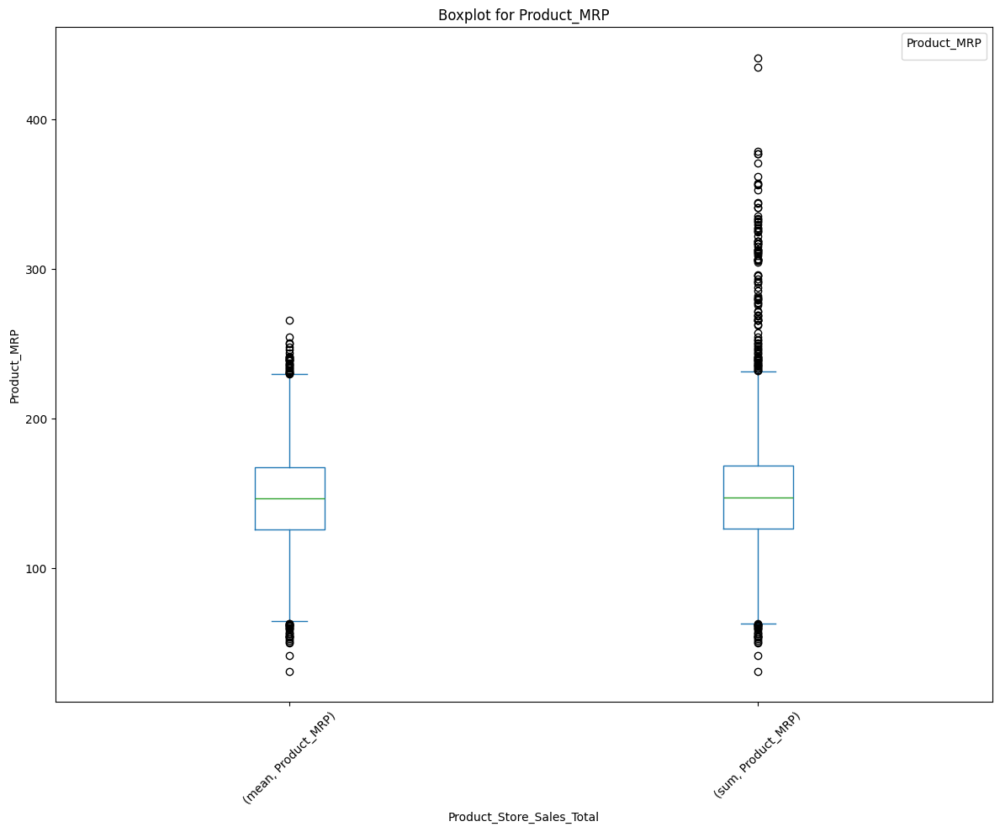

----------------------------------------------------------------------------------------------------


,mean,count,sum
,Store_Establishment_Year,Store_Establishment_Year,Store_Establishment_Year
Product_Store_Sales_Total,,,
33.00,1998.0,1,1998
166.92,1998.0,1,1998
180.86,1998.0,1,1998
183.02,1998.0,1,1998
203.55,1998.0,1,1998
...,...,...,...
6796.94,1999.0,1,1999
6835.81,1999.0,1,1999


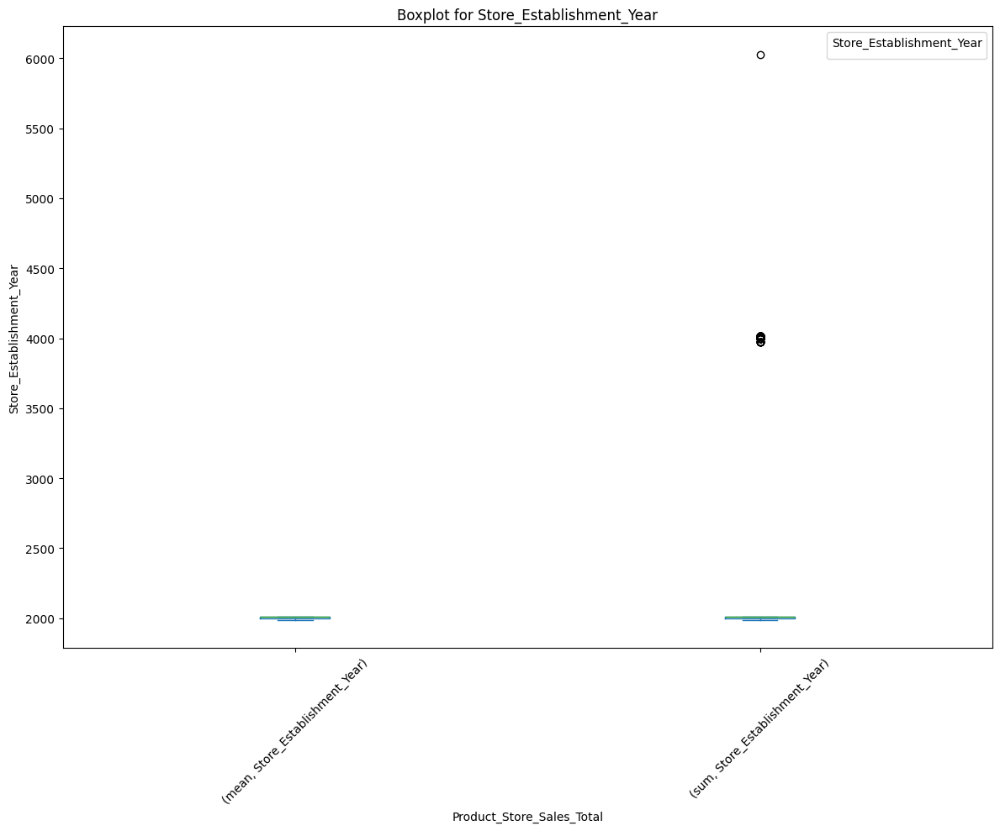

----------------------------------------------------------------------------------------------------


{'Product_Weight':                                     mean          count            sum
                           Product_Weight Product_Weight Product_Weight
 Product_Store_Sales_Total                                             
 33.00                               4.00              1           4.00
 166.92                              7.64              1           7.64
 180.86                              6.95              1           6.95
 183.02                              4.28              1           4.28
 203.55                              7.02              1           7.02
 ...                                  ...            ...            ...
 6796.94                            12.59              1          12.59
 6835.81                            20.65              1          20.65
 6862.43                            19.61              1          19.61
 6977.43                            20.30              1          20.30
 8000.00                            22.00     

In [22]:
EDA.pivot_table_all(data=superKart,predictors=numeric_features,target=target,chart_type=None,stats=['mean','count','sum'])

### Field Level Analysis

#### Details of each store sorted by average total sales by store?

In [23]:
# Group, aggregate, and sort by total revenue
store_avg_info = (
    superKart.groupby('Store_Id')[['Store_Size', 'Store_Type', 'Product_Store_Sales_Total']]
    .agg({
        'Store_Size': 'first',
        'Store_Type': 'first',
        'Product_Store_Sales_Total': 'mean'
    })
    .reset_index()
    .sort_values(by='Product_Store_Sales_Total', ascending=False)
)

# Display the DataFrame in a clean tabular format
# Format large numbers with commas
store_avg_info['Product_Store_Sales_Total'] = store_avg_info['Product_Store_Sales_Total'].apply(lambda x: f"{x:,.0f}")

# Show the DataFrame
display(store_avg_info)


,Store_Id,Store_Size,Store_Type,Product_Store_Sales_Total
2,OUT003,Medium,Departmental Store,"4,947"
0,OUT001,High,Supermarket Type1,"3,924"
3,OUT004,Medium,Supermarket Type2,"3,299"
1,OUT002,Small,Food Mart,"1,763"


🔎  **OBSERVATION:**

- Based on the above table, we can see **Store ID OUT003** has the highest average sales by store.

#### The total sales revenue by **Product Type** per Store

In [24]:
# Generate table displaying total sales revenue by Product Type per Store
pivot_sales_revenue = superKart.pivot_table(
    index='Product_Type',
    columns='Store_Id',
    values='Product_Store_Sales_Total',
    aggfunc='sum',
    fill_value=0
)

pivot_sales_revenue = pivot_sales_revenue.sort_values(by=pivot_sales_revenue.columns.tolist(), ascending=False)
display(pivot_sales_revenue)


Store_Id,OUT001,OUT002,OUT003,OUT004
Product_Type,,,,
Snack Foods,806142.24,255317.57,918510.44,2009026.70
Fruits and Vegetables,792992.59,298503.56,897437.46,2311899.66
Dairy,598767.62,178888.18,715814.94,1318447.30
Frozen Foods,558556.81,180295.95,597608.42,1473519.65
Household,531371.38,184665.65,523981.64,1324721.50
Baking Goods,525131.04,169860.50,491908.20,1266086.26
Meat,505867.28,151800.01,520939.68,950604.97
Canned,449016.38,151467.66,452445.17,1247153.50
Health and Hygiene,435005.31,164660.81,439139.18,1124901.91


🔎  **OBSERVATION:**

- Based on the above table, we can see the sum of total sales for each product type by store.
- I don't see any anomalous items in the date above.

####  Data in a Heatmap

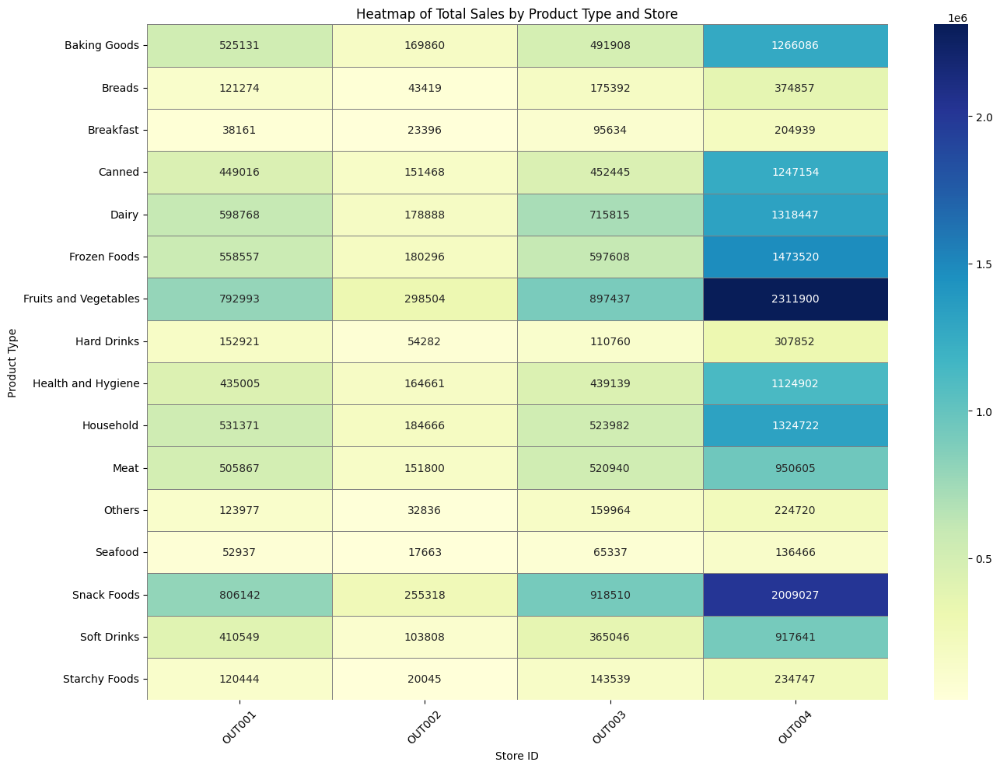

In [25]:
# Generate heatmap displaying total sales revenue by Product Type per Store
# Pivot table: sum of sales by Product_Type and Store_Id

pivot_table = superKart.pivot_table(
    index='Product_Type',
    columns='Store_Id',
    values='Product_Store_Sales_Total',
    aggfunc='sum',
    fill_value=0
)

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=0.5, linecolor='gray')
plt.title("Heatmap of Total Sales by Product Type and Store")
plt.ylabel("Product Type")
plt.xlabel("Store ID")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

🔎  **OBSERVATION:**

- From the heatmap above, we can see that store **OUT004** has high sales for **Snack Foods**, **Fruits and Vegetables**, and **Frozen Foods**.
- I don't see any other anomalous data

### Let's do a deeper analysis of each store

#### Store OUT001

In [26]:
# Define a utility function to output each store's data.
# Create barplot of Total Sales by Product Type
def explore_store(store_id):
    store_data = superKart[superKart["Store_Id"] == store_id]

    print(f"🔍 Summary for Store: {store_id}")               # Print the overall summary table for store
    display(store_data.describe(include="all").T)

    print("-" * 100)                                         # Print a separator line between tables

    print("\n📊 Product Type Distribution:")                 # Print the overall store distribution by Product Type
    display(store_data["Product_Type"].value_counts())

    print("-" * 100)                                         # Print a separator line between tables

    print("\n📈 Revenue Distribution by Product Type:")      # Print the overall revenue distribution by Product Type
    display(store_data.groupby("Product_Type")["Product_Store_Sales_Total"].sum().sort_values(ascending=False))

    print("-" * 100)                                         # Print a separator line between tables

    # Barplot of sales per product type
    plt.figure(figsize=(10, 4))
    sns.barplot(
        data=store_data,
        y="Product_Type",
        x="Product_Store_Sales_Total",
        estimator=sum,
        errorbar=None
    )
    plt.title(f"Total Sales by Product Type for {store_id}")
    plt.tight_layout()
    plt.show()

🔍 Summary for Store: OUT001


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Product_Id,1586,1586,FD5075,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Weight,1586.0,NaN,NaN,NaN,13.458865,2.064975,6.16,12.0525,13.96,14.95,17.97
Product_Sugar_Content,1586,3,Low Sugar,845,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Allocated_Area,1586.0,NaN,NaN,NaN,0.068768,0.047131,0.004,0.033,0.0565,0.094,0.295
Product_Type,1586,16,Snack Foods,202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_MRP,1586.0,NaN,NaN,NaN,160.514054,30.359059,71.35,141.72,168.32,182.9375,226.59
Store_Id,1586,1,OUT001,1586,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Establishment_Year,1586.0,NaN,NaN,NaN,1987.0,0.0,1987.0,1987.0,1987.0,1987.0,1987.0
Store_Size,1586,1,High,1586,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Location_City_Type,1586,1,Tier 2,1586,NaN,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------

📊 Product Type Distribution:


Product_Type
Snack Foods              202
Fruits and Vegetables    199
Dairy                    150
Frozen Foods             142
Baking Goods             136
Household                134
Meat                     130
Canned                   119
Health and Hygiene       114
Soft Drinks              106
Hard Drinks               38
Starchy Foods             32
Others                    31
Breads                    30
Seafood                   13
Breakfast                 10
Name: count, dtype: int64

----------------------------------------------------------------------------------------------------

📈 Revenue Distribution by Product Type:


Product_Type
Snack Foods              806142.24
Fruits and Vegetables    792992.59
Dairy                    598767.62
Frozen Foods             558556.81
Household                531371.38
Baking Goods             525131.04
Meat                     505867.28
Canned                   449016.38
Health and Hygiene       435005.31
Soft Drinks              410548.69
Hard Drinks              152920.74
Others                   123977.09
Breads                   121274.09
Starchy Foods            120443.98
Seafood                   52936.84
Breakfast                 38161.10
Name: Product_Store_Sales_Total, dtype: float64

----------------------------------------------------------------------------------------------------


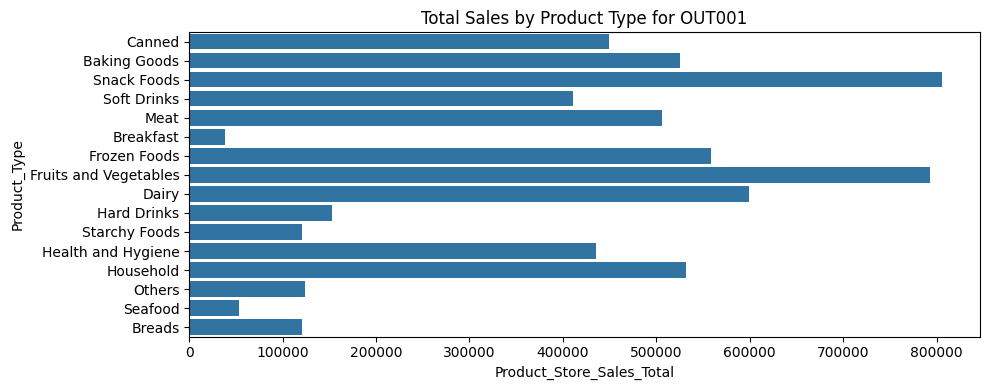

In [27]:
# Call the above function for Store OUT001
explore_store("OUT001")

🔎  **OBSERVATION:**

- We can see from the data above, **Store OUT001** is a **Supermarket Type1** store.
- It's in a **Tier 2** city location.
- It was established in **1987**.
- It's a store size of type **High**.
- It earns most of it's revenue from **snack foods**, followed by **Fruits and Vegetables**
- It earns the least on **Breakfast Foods**.

#### Store OUT002

🔍 Summary for Store: OUT002


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Product_Id,1152,1152,NC1180,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Weight,1152.0,NaN,NaN,NaN,9.911241,1.799846,4.0,8.7675,9.795,10.89,19.82
Product_Sugar_Content,1152,3,Low Sugar,658,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Allocated_Area,1152.0,NaN,NaN,NaN,0.067747,0.047567,0.006,0.031,0.0545,0.09525,0.292
Product_Type,1152,16,Fruits and Vegetables,168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_MRP,1152.0,NaN,NaN,NaN,107.080634,24.912333,31.0,92.8275,104.675,117.8175,224.93
Store_Id,1152,1,OUT002,1152,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Establishment_Year,1152.0,NaN,NaN,NaN,1998.0,0.0,1998.0,1998.0,1998.0,1998.0,1998.0
Store_Size,1152,1,Small,1152,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Location_City_Type,1152,1,Tier 3,1152,NaN,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------

📊 Product Type Distribution:


Product_Type
Fruits and Vegetables    168
Snack Foods              146
Dairy                    104
Frozen Foods             101
Household                100
Baking Goods              96
Health and Hygiene        91
Canned                    88
Meat                      87
Soft Drinks               62
Hard Drinks               30
Breads                    23
Others                    19
Breakfast                 15
Starchy Foods             12
Seafood                   10
Name: count, dtype: int64

----------------------------------------------------------------------------------------------------

📈 Revenue Distribution by Product Type:


Product_Type
Fruits and Vegetables    298503.56
Snack Foods              255317.57
Household                184665.65
Frozen Foods             180295.95
Dairy                    178888.18
Baking Goods             169860.50
Health and Hygiene       164660.81
Meat                     151800.01
Canned                   151467.66
Soft Drinks              103808.35
Hard Drinks               54281.85
Breads                    43419.47
Others                    32835.73
Breakfast                 23396.10
Starchy Foods             20044.98
Seafood                   17663.35
Name: Product_Store_Sales_Total, dtype: float64

----------------------------------------------------------------------------------------------------


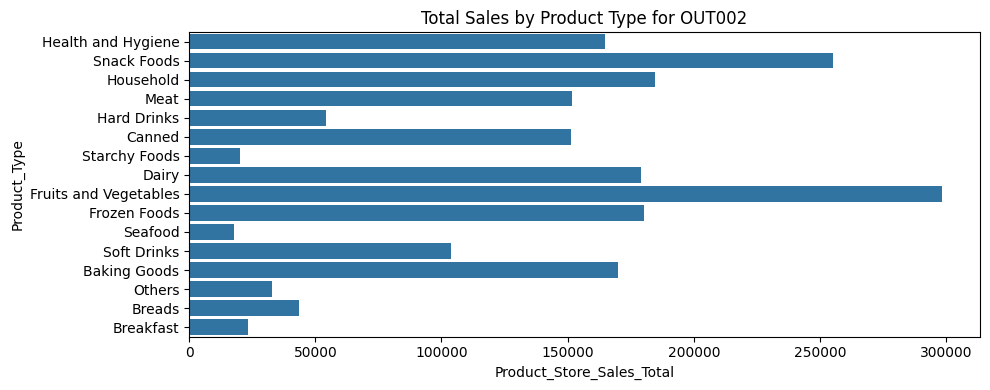

In [28]:
# Call the above function for Store OUT002
explore_store("OUT002")

🔎  **OBSERVATION:**

- We can see from the data above, **Store OUT002** is a **Food Mart**.
- It's in a **Tier 3** city location.
- It was established in **1998**.
- It's a store size of type **Small**.
- It earns most of it's revenue from **Fruits and Vegetables** followed by **Snack Foods**
- It earns the least on **Seafood**.

#### Store OUT003

🔍 Summary for Store: OUT003


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Product_Id,1349,1349,FD7839,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Weight,1349.0,NaN,NaN,NaN,15.103692,1.893531,7.35,14.02,15.18,16.35,22.0
Product_Sugar_Content,1349,3,Low Sugar,750,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Allocated_Area,1349.0,NaN,NaN,NaN,0.068637,0.048708,0.004,0.031,0.057,0.094,0.298
Product_Type,1349,16,Snack Foods,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_MRP,1349.0,NaN,NaN,NaN,181.358725,24.796429,85.88,166.92,179.67,198.07,266.0
Store_Id,1349,1,OUT003,1349,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Establishment_Year,1349.0,NaN,NaN,NaN,1999.0,0.0,1999.0,1999.0,1999.0,1999.0,1999.0
Store_Size,1349,1,Medium,1349,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Location_City_Type,1349,1,Tier 1,1349,NaN,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------

📊 Product Type Distribution:


Product_Type
Snack Foods              186
Fruits and Vegetables    182
Dairy                    145
Frozen Foods             122
Household                107
Meat                     106
Baking Goods              99
Canned                    90
Health and Hygiene        89
Soft Drinks               74
Breads                    34
Others                    32
Starchy Foods             28
Hard Drinks               23
Breakfast                 19
Seafood                   13
Name: count, dtype: int64

----------------------------------------------------------------------------------------------------

📈 Revenue Distribution by Product Type:


Product_Type
Snack Foods              918510.44
Fruits and Vegetables    897437.46
Dairy                    715814.94
Frozen Foods             597608.42
Household                523981.64
Meat                     520939.68
Baking Goods             491908.20
Canned                   452445.17
Health and Hygiene       439139.18
Soft Drinks              365046.30
Breads                   175391.93
Others                   159963.75
Starchy Foods            143538.60
Hard Drinks              110760.30
Breakfast                 95634.08
Seafood                   65337.48
Name: Product_Store_Sales_Total, dtype: float64

----------------------------------------------------------------------------------------------------


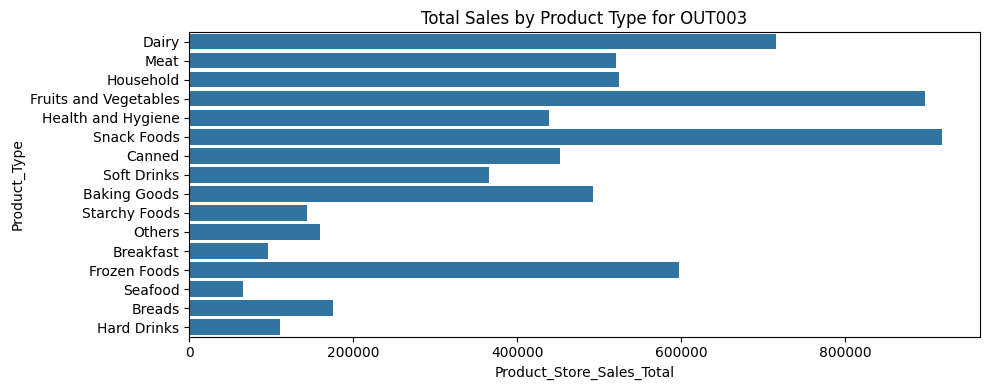

In [29]:
# Call the above function for Store OUT003
explore_store("OUT003")

🔎  **OBSERVATION:**

- We can see from the data above, **Store OUT003** is a **Department Store**.
- It's in a **Tier 1** city location.
- It was established in **1999**.
- It's a store size of type **Medium**.
- It earns most of it's revenue from **Snack Foods** followed by **Fruits and Vegetables** similar to Store OUT001
- It also earns the least on **Seafood**.

#### Store OUT004

🔍 Summary for Store: OUT004


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Product_Id,4676,4676,FD6114,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Weight,4676.0,NaN,NaN,NaN,12.349613,1.428199,7.34,11.37,12.37,13.3025,17.79
Product_Sugar_Content,4676,3,Low Sugar,2632,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_Allocated_Area,4676.0,NaN,NaN,NaN,0.069092,0.048584,0.004,0.031,0.056,0.097,0.297
Product_Type,4676,16,Fruits and Vegetables,700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product_MRP,4676.0,NaN,NaN,NaN,142.399709,17.513973,83.04,130.54,142.82,154.1925,197.66
Store_Id,4676,1,OUT004,4676,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Establishment_Year,4676.0,NaN,NaN,NaN,2009.0,0.0,2009.0,2009.0,2009.0,2009.0,2009.0
Store_Size,4676,1,Medium,4676,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Store_Location_City_Type,4676,1,Tier 2,4676,NaN,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------

📊 Product Type Distribution:


Product_Type
Fruits and Vegetables    700
Snack Foods              615
Frozen Foods             446
Household                399
Dairy                    397
Baking Goods             385
Canned                   380
Health and Hygiene       334
Meat                     295
Soft Drinks              277
Breads                   113
Hard Drinks               95
Others                    69
Starchy Foods             69
Breakfast                 62
Seafood                   40
Name: count, dtype: int64

----------------------------------------------------------------------------------------------------

📈 Revenue Distribution by Product Type:


Product_Type
Fruits and Vegetables    2311899.66
Snack Foods              2009026.70
Frozen Foods             1473519.65
Household                1324721.50
Dairy                    1318447.30
Baking Goods             1266086.26
Canned                   1247153.50
Health and Hygiene       1124901.91
Meat                      950604.97
Soft Drinks               917641.38
Breads                    374856.75
Hard Drinks               307851.73
Starchy Foods             234746.89
Others                    224719.73
Breakfast                 204939.13
Seafood                   136466.37
Name: Product_Store_Sales_Total, dtype: float64

----------------------------------------------------------------------------------------------------


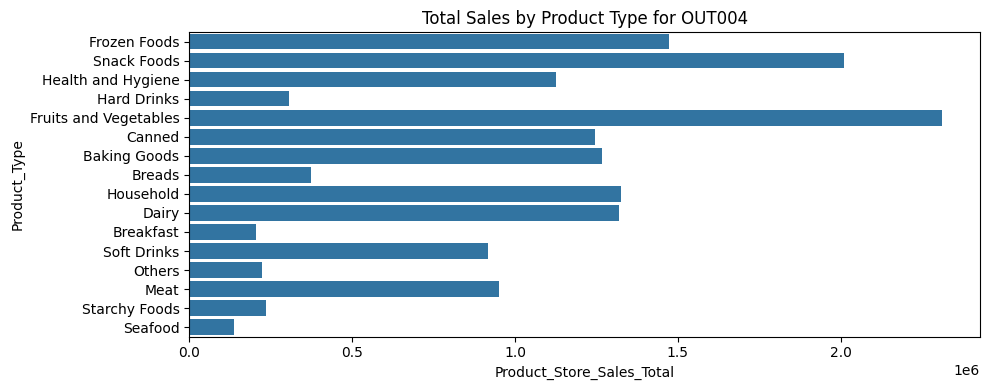

In [30]:
# Call the above function for Store OUT004
explore_store("OUT004")

🔎  **OBSERVATION:**

- We can see from the data above, **Store OUT004** is a **Supermarket Type2** Store.
- It's in a **Tier 2** city location.
- It was established in **2009**.
- It's a store size of type **Medium**.
- It earns most of it's revenue from **Fruits and Vegetables** followed by **Snack Foods** similar to Store OUT002
- It also earns the least on **Seafood**.

### Final Data Checks
1. class imbalance
2. outliers
3. missing value validation again
4. skewness

#### 1. Check for Class Imbalance (Categorical Features)

In [31]:
# Loop through all selected categorical features
# and print the percentage distribution of each category
for col in categorical_features:
    print(f"\nColumn: {col}")
    print(superKart[col].value_counts(normalize=True).round(3) * 100)


Column: Product_Sugar_Content
Product_Sugar_Content
Low Sugar    55.7
Regular      26.9
No Sugar     17.3
Name: proportion, dtype: float64

Column: Product_Type
Product_Type
Fruits and Vegetables    14.3
Snack Foods              13.1
Frozen Foods              9.3
Dairy                     9.1
Household                 8.4
Baking Goods              8.2
Canned                    7.7
Health and Hygiene        7.2
Meat                      7.1
Soft Drinks               5.9
Breads                    2.3
Hard Drinks               2.1
Others                    1.7
Starchy Foods             1.6
Breakfast                 1.2
Seafood                   0.9
Name: proportion, dtype: float64

Column: Store_Size
Store_Size
Medium    68.8
High      18.1
Small     13.1
Name: proportion, dtype: float64

Column: Store_Location_City_Type
Store_Location_City_Type
Tier 2    71.5
Tier 1    15.4
Tier 3    13.1
Name: proportion, dtype: float64

Column: Store_Type
Store_Type
Supermarket Type2     53.4
Supermar

🔎  **OBSERVATION:**

- While some categorical features such as Product_Sugar_Content, Store_Size, and Store_Location_City_Type exhibit moderate class imbalance, none are extreme enough to warrant resampling or weighting adjustments in the modeling phase.

- I believe this distribution is acceptable for model training without additional correction.

#### 2. Check for Outliers (Numerical Features)

In [32]:
# Detect outliers using the IQR method for all numeric features
for col in numeric_features:
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    q1 = superKart[col].quantile(0.25)
    q3 = superKart[col].quantile(0.75)
    iqr = q3 - q1

    # Identify data points that fall outside 1.5 * IQR
    outliers = superKart[(superKart[col] < q1 - 1.5 * iqr) | (superKart[col] > q3 + 1.5 * iqr)]

    # Print count of outliers
    print(f"{col}: {len(outliers)} outliers")

Product_Weight: 54 outliers
Product_Allocated_Area: 104 outliers
Product_MRP: 57 outliers
Store_Establishment_Year: 0 outliers


🔎  **OBSERVATION:**

- Outliers were detected in several numerical features using the IQR method. However, after examining their frequency and context during univariate analysis, they appear to reflect valid business scenarios (e.g., high **Product_MRP** or larger product weights). Therefore, I opted not to apply capping or transformation, as these values are likely informative for sales prediction rather than errors.

#### 3. Re-Check for any missing data

In [33]:
# Re-check and display only columns with missing values (if any)
missing_data = superKart.isnull().sum()
missing_data = missing_data[missing_data > 0]
print(missing_data if not missing_data.empty else "No missing data found.")

No missing data found.


🔎  **OBSERVATION:**

- No missing values were introduced or overlooked during Univariate or Bivariate EDA. The dataset remains clean and fully populated, confirming no imputation is required before modeling.

#### 4. Skewness Check for Target and Predictors

In [34]:
# Check skewness for numeric features and target
# Values > 1 or < -1 are considered highly skewed
superKart[numeric_features + [target]].skew().sort_values(ascending=False)

Product_Allocated_Area       1.128093
Product_Store_Sales_Total    0.092024
Product_MRP                  0.036513
Product_Weight               0.017514
Store_Establishment_Year    -0.758061
dtype: float64

🔎  **OBSERVATION:**

Based on the above:

- **Product_Allocated_Area**: Highly right-skewed (skew > 1) — could benefit from a log transformation to normalize.

- **Product_Store_Sales_Total** (target): Nearly symmetric — no transformation required.

- **Product_MRP**: Close to normal — transformation not needed.

- **Product_Weight**: Symmetric — no transformation needed.

- **Store_Establishment_Year**: Mild left skew — acceptable as-is, no transformation planned.

# Data Preprocessing
- Data Preprocessing Steps Checklist (recommended order)

  1. Drop Irrelevant Columns (e.g. Product_Id, Store_Id — unique identifiers)

  2. Split Features and Target

  3. Train/Test Split
(80/20 is typical)

  4. One-Hot Encoding for Categorical Variables

  5. Feature Scaling (for numerical features)
(Optional, depending on model)

  6. Pipeline Creation
(ColumnTransformer, Pipeline, etc.)

  7. Final Fit/Transform

#### Transform **Product_Allocated_Area** to adjust for skewness
1. **Product_Allocated_Area** is **highly right skewed** - (skewness > 1)
2. Drop original **Product_Allocated_Area** column to use **Product_Allocated_Area_Log** in my model.

In [35]:
# Log-transform 'Product_Allocated_Area' to reduce right skewness
# log1p is used instead of log to handle zero values safely
superKart['Product_Allocated_Area_Log'] = np.log1p(superKart['Product_Allocated_Area'])

# Reconstruct the original column from the log-transformed version because I made a mistake below.
# Recomment this out after I have it correct.
# dataset['Product_Allocated_Area'] = np.expm1(dataset['Product_Allocated_Area_Log'])

# Drop the new Product_Allocated_Area_Log column
#dataset.drop(columns=['Product_Allocated_Area_Log'], inplace=True)

# Drop the original skewed column
superKart.drop(columns=['Product_Allocated_Area'], inplace=True)

# Display remaining columns to confirm changes
print("Current columns in dataset:")
print(superKart.columns)

Current columns in dataset:
Index(['Product_Id', 'Product_Weight', 'Product_Sugar_Content', 'Product_Type',
       'Product_MRP', 'Store_Id', 'Store_Establishment_Year', 'Store_Size',
       'Store_Location_City_Type', 'Store_Type', 'Product_Store_Sales_Total',
       'Product_Allocated_Area_Log'],
      dtype='str')


🔎  **OBSERVATION:**

- I can see from the columns above, I have dropped the original **Product_Allocated_Area** column and now only have the log transformed column **Product_Allocated_Area_Log**.

#### Transform **Product_Sugar_Content** column
- I have already addressed this data issue above prior to EDA Analysis.

#### Address the high number of Product Types (16) to see if we can group them.
Creating two categories, perishables and non perishables, in order to reduce the number of product types to simplify one-hot encoding
- This should simplify our model
- Improve model generalization
- Reduce the number of dummy variables
- Reduces dimensionality

In [36]:
# Grouping Product_Type into Perishables vs. Non Perishables
perishable_types = [
    'Dairy', 'Fruits and Vegetables', 'Meat', 'Breads', 'Seafood'
]

# Create a new column 'Product_Type_Category' with grouped values
superKart['Product_Type_Category'] = superKart['Product_Type'].apply(
    lambda x: 'Perishables' if x in perishable_types else 'Non Perishables'
)

# Drop the original high-cardinality column
superKart.drop(columns=['Product_Type'], inplace=True)

# Confirm the transformation
print(superKart['Product_Type_Category'].value_counts())

Product_Type_Category
Non Perishables    5824
Perishables        2939
Name: count, dtype: int64


🔎  **OBSERVATION:**

- We grouped the original 16 Product_Type values into two broader categories — Perishables and Non Perishables. This was done to simplify one-hot encoding, reduce dimensionality, and support better model generalization. The new column **Product_Type_Category** will be used in modeling going forward.

- We'll drop the original column **Product_Type** during Data Preparation below.
- Since I reduced the number of product types here I'll go ahead and drop the `Product_Id` column since I no longer need to further reduce the types of products.

## Data Preparation for Modeling
Our goal is to forecast the **Product_Store_Sales_Total**.

1. Before building the model, we'll drop unnecessary columns and encode the categorical features.

2. We'll then split the data into training and testing sets to evaluate the model's performance on unseen data.

In [37]:
# Re-Print the first 5 rows of the dataset
superKart.head()

,Product_Id,Product_Weight,Product_Sugar_Content,Product_MRP,Store_Id,Store_Establishment_Year,Store_Size,Store_Location_City_Type,Store_Type,Product_Store_Sales_Total,Product_Allocated_Area_Log,Product_Type_Category
0,FD6114,12.66,Low Sugar,117.08,OUT004,2009,Medium,Tier 2,Supermarket Type2,2842.40,0.026642,Non Perishables
1,FD7839,16.54,Low Sugar,171.43,OUT003,1999,Medium,Tier 1,Departmental Store,4830.02,0.134531,Perishables
2,FD5075,14.28,Regular,162.08,OUT001,1987,High,Tier 2,Supermarket Type1,4130.16,0.030529,Non Perishables
3,FD8233,12.10,Low Sugar,186.31,OUT001,1987,High,Tier 2,Supermarket Type1,4132.18,0.106160,Non Perishables
4,NC1180,9.57,No Sugar,123.67,OUT002,1998,Small,Tier 3,Food Mart,2279.36,0.009950,Non Perishables


#### Drop Unnecessary Columns
**Remove the columns that are not required.**

1. '**Product_Id**', '**Store_Id**' → unique identifiers. We already transformed our **Product_Types** into **Product_Type_Category** for **perishables** and **non-perishables**. No need to further break down **Product_Types** using the **Product_Type** "Prefix". We'll just drop this column completely.

2. 'Product_Type' → replaced with 'Product_Type_Category'

3. 'Store_Establishment_Year' → already analyzed and found not predictive

In [38]:
# Drop unnecessary columns (exclude 'Product_Type' - already dropped earlier)
data = superKart.drop(
    ["Product_Id", "Store_Id", "Store_Establishment_Year"],
    axis=1,
    errors='ignore'  # ignores columns that aren't found
)

# Print the number of rows and columns
print("Shape of the data:", data.shape)
print("-" * 100)  # Print a divider line

# Print the first 5 rows of the data
data.head()


Shape of the data: (8763, 9)
----------------------------------------------------------------------------------------------------


,Product_Weight,Product_Sugar_Content,Product_MRP,Store_Size,Store_Location_City_Type,Store_Type,Product_Store_Sales_Total,Product_Allocated_Area_Log,Product_Type_Category
0,12.66,Low Sugar,117.08,Medium,Tier 2,Supermarket Type2,2842.40,0.026642,Non Perishables
1,16.54,Low Sugar,171.43,Medium,Tier 1,Departmental Store,4830.02,0.134531,Perishables
2,14.28,Regular,162.08,High,Tier 2,Supermarket Type1,4130.16,0.030529,Non Perishables
3,12.10,Low Sugar,186.31,High,Tier 2,Supermarket Type1,4132.18,0.106160,Non Perishables
4,9.57,No Sugar,123.67,Small,Tier 3,Food Mart,2279.36,0.009950,Non Perishables


#### Separating Features and Target

In [39]:
# Separate features and target variable
X = data.drop("Product_Store_Sales_Total", axis=1)  # Feature set
y = data["Product_Store_Sales_Total"]               # Target variable

🔎  **OBSERVATION:**

- We separated the dataset into feature variables X and target variable y. The column **Product_Store_Sales_Total** is designated as the prediction target for our regression model. All other columns will be used as predictors.

#### Train-Test Split

In [40]:
# Split the dataset into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Check the shape of the splits
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (7010, 8)
X_test shape: (1753, 8)
y_train shape: (7010,)
y_test shape: (1753,)


🔎  **OBSERVATION:**

- The dataset has been split into training and testing subsets using an 80:20 ratio. This ensures the model can be trained on the majority of data while being evaluated on a holdout set for unbiased performance measurement. The random_state ensures reproducibility of results.
- The target variable (y) is correctly split into training and testing sets with the same number of rows as X_train and X_test.

### Data Pre-processing Pipeline
Step 1: Identify Categorical Features

In [41]:
# Automatically detect categorical features
categorical_features = data.select_dtypes(include=['object', 'category']).columns.tolist()

# Display detected categorical features
print("Categorical Features:", categorical_features)

Categorical Features: ['Product_Sugar_Content', 'Store_Size', 'Store_Location_City_Type', 'Store_Type', 'Product_Type_Category']


🔎  **OBSERVATION:**

- This step programmatically identifies all columns with type '**object**' or '**category**', which are typically non-numeric and need to be one-hot encoded before being used in machine learning models.



Step 2: Create Preprocessor for Categorical Encoding

In [42]:
# Define a preprocessor that applies OneHotEncoding to all categorical features
preprocessor = make_column_transformer(
    (Pipeline([
        ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ]), categorical_features),
    remainder='passthrough'  # Leave all non-categorical columns (numerical) unchanged
)

🔎  **OBSERVATION:**

- We use **make_column_transformer** to apply a **OneHotEncoder** to the categorical columns while leaving numerical features untouched (**remainder='passthrough'**). The **handle_unknown='ignore'** ensures the model won’t crash on unseen categories during prediction.



# Model Building

### Define functions for Model Evaluation
- We'll fit different models on the train data and observe their performance.
- We'll try to improve that performance by tuning some hyperparameters available for that algorithm.
- We'll use GridSearchCv for hyperparameter tuning and `r_2 score` to optimize the model.

Let's start by creating a function to get model scores, so that we don't have to use the same code repeatedly.

In [43]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mean_absolute_percentage_error(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

### Random Forest Regressor - Model Training Pipeline - Base Model
- Initialize the base Random Forest Regressormodel.
- This initializes a basic Random Forest with default parameters.

In [44]:
# Define base Random Forest model
rf_model = RandomForestRegressor(random_state=VKPy.RANDOM_STATE)

#### Create a Pipeline with Preprocessing and Model
- `preprocessor`: This includes our one-hot encoding pipeline defined earlier.
- Combines data preprocessing and model training into a single object for workflow cleanliness and reproducibility.

In [45]:
# Create pipeline with preprocessing and Random Forest model
rf_pipeline = make_pipeline(preprocessor, rf_model)

#### Fit the Pipeline
- Trains the entire pipeline on training set — categorical encoding + random forest.


In [46]:
# Train the model pipeline on the training data
rf_pipeline.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('columntransformer', ...), ('randomforestregressor', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('pipeline', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the differ

#### Evaluate Model Performance on Training and Test
- this will give display a clean summary of how the model performs on both training and test data.

In [47]:
# Evaluate performance on training data
rf_estimator_model_train_perf = model_performance_regression(rf_pipeline, X_train,y_train)
print("Training performance \n")
rf_estimator_model_train_perf

Training performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,106.511554,39.994721,0.989996,0.989985,0.014815


In [48]:
# Evaluate performance on test data
rf_estimator_model_test_perf = model_performance_regression(rf_pipeline, X_test,y_test)
print("Testing performance \n")
rf_estimator_model_test_perf

Testing performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,284.847049,109.342026,0.92889,0.928564,0.039248


🔎  **OBSERVATION:**

- The model may be only slightly overfitting, as it has a higher R-squared on the train set (0.989983) than on the test set (0.928597). This indicates that it performs slightly worse on unseen data but is still high > 90%.

- Let's try to reduce this overfitting by tuning the hyperparameters.

### Random Forest Regressor - Hyperparameter Tuning
- Create a pipeline with preprocessing + model
- Use `GridSearchCV` with `r2_score` as the scoring metric
- Fit `GridSearchCV` on the training data (X_train, y_train)
- Extract the best estimator (best_estimator_)
- Evaluate performance on train and test sets

In [49]:
# Choose the type of classifier.
rf_tuned = RandomForestRegressor(random_state=VKPy.RANDOM_STATE)

# Create pipeline with preprocessing and RandomForestRegressor model
rf_pipeline = make_pipeline(preprocessor, rf_tuned)

# Grid of parameters to choose from
parameters = parameters = {
    'randomforestregressor__max_depth':[3, 4, 5, 6],
    'randomforestregressor__max_features': ['sqrt','log2',None],
    'randomforestregressor__n_estimators': [50, 75, 100, 125, 150]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(rf_pipeline, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_tuned.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('columntransformer', ...), ('randomforestregressor', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('pipeline', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the differ

#### Evaluate Model Performance on Training and Test for the Hypertuned Random Forest Model
- this will give display a clean summary of how the model performs on both training and test data.

In [50]:
# Evaluate performance on training data
rf_tuned_model_train_perf = model_performance_regression(rf_tuned, X_train, y_train)
print("Training performance \n")
rf_tuned_model_train_perf

Training performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,293.487611,155.034286,0.924046,0.923959,0.055601


In [51]:
# Evaluate performance on test data
rf_tuned_model_test_perf = model_performance_regression(rf_tuned, X_test, y_test)
print("Testing performance \n")
rf_tuned_model_test_perf

Testing performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,315.225388,168.171823,0.912914,0.912514,0.05934


🔎  **Observation:**

- The performance metrics for the **hypertuned Random Forest model** are very close to those of our **base Random Forest model** but is underperforming the base model.
- **Hypertuning did not significantly improve model performance**
- The base model was already well-optimized by default.
- The hypertuned model overfits less, but at the cost of accuracy.

### XGBoost Regressor - Model Training Pipeline

In [52]:
# Define base XGBoost model
xgb_model = XGBRegressor(random_state=VKPy.RANDOM_STATE)

#### Create a Pipeline with Preprocessing and Model
- `preprocessor`: This includes our one-hot encoding pipeline defined earlier.
- Combines data preprocessing and model training into a single object for workflow cleanliness and reproducibility.

In [53]:
# Create pipeline with preprocessing and XGBoost model
xgb_pipeline = make_pipeline(preprocessor, xgb_model)

#### Fit the Pipeline
- Trains the entire pipeline on training set — categorical encoding + XGBoost.


In [54]:
# Train the model pipeline on the training data
xgb_pipeline.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('columntransformer', ...), ('xgbregressor', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('pipeline', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different trans

#### Evaluate Model Performance on Training and Test
- This will give display a clean summary of how the model performs on both training and test data.

In [55]:
# Evaluate performance on training data
xgb_estimator_model_train_perf = model_performance_regression(xgb_pipeline, X_train, y_train)
print("Training performance \n")
xgb_estimator_model_train_perf

Training performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,136.324944,62.233689,0.983612,0.983593,0.022171


In [56]:
# Evaluate performance on test data
xgb_estimator_model_test_perf = model_performance_regression(xgb_pipeline, X_test,y_test)
print("Testing performance \n")
xgb_estimator_model_test_perf

Testing performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,308.354445,136.366693,0.916669,0.916287,0.049794


🔎  **OBSERVATION:**

- All three models are performing close on the test set, with marginal differences in RMSE, MAE, R², and MAPE.
- XGBoost (base) and Random Forest (base) seem to be performing about equal.
- Moving on to hypertuning XGBoost with `GridSearchCV`.

### XGBoost Regressor - Hyperparameter Tuning
- Create a pipeline with preprocessing + model
- Fit `RandomizedSearchCV` on the training data (X_train, y_train)
- Extract the best estimator (best_estimator_)
- Evaluate performance on train and test sets

In [57]:
# Choose the type of classifier
xgb_tuned = XGBRegressor(random_state=VKPy.RANDOM_STATE)

# Create pipeline with preprocessing and XGBoost model
xgb_pipeline = make_pipeline(preprocessor, xgb_tuned)

#Grid of parameters to choose from
param_grid = {
    'xgbregressor__n_estimators': [50, 100, 150, 200],    # number of trees to build
    'xgbregressor__max_depth': [2, 3, 4],    # maximum depth of each tree
    'xgbregressor__colsample_bytree': [0.4, 0.5, 0.6],    # percentage of attributes to be considered (randomly) for each tree
    'xgbregressor__colsample_bylevel': [0.4, 0.5, 0.6],    # percentage of attributes to be considered (randomly) for each level of a tree
    'xgbregressor__learning_rate': [0.01, 0.05, 0.1],    # learning rate
    'xgbregressor__reg_lambda': [0.4, 0.5, 0.6],    # L2 regularization factor
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

from sklearn.model_selection import RandomizedSearchCV

# Run the randomized search
grid_obj = RandomizedSearchCV(
    xgb_pipeline,
    param_distributions=param_grid,
    n_iter=100,
    scoring=scorer,
    cv=3,
    n_jobs=-1,
    random_state=42
)

# Start timing
start = time.time()

# Fit the randomized search
grid_obj = grid_obj.fit(X_train, y_train)

# End timing
end = time.time()
print(f"Tuning completed in {end - start:.2f} seconds")

# Best hyperparameters
print("Best hyperparameters found:")
print(grid_obj.best_params_)
print("-" * 80)

# Set the best estimator
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the training data
xgb_tuned.fit(X_train, y_train)


Tuning completed in 5.22 seconds
Best hyperparameters found:
{'xgbregressor__reg_lambda': 0.5, 'xgbregressor__n_estimators': 150, 'xgbregressor__max_depth': 4, 'xgbregressor__learning_rate': 0.1, 'xgbregressor__colsample_bytree': 0.6, 'xgbregressor__colsample_bylevel': 0.6}
--------------------------------------------------------------------------------


,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('columntransformer', ...), ('xgbregressor', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('pipeline', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different trans

#### Evaluate Model Performance on Training and Test for the Hypertuned XGBoost Model
- this will give display a clean summary of how the model performs on both training and test data.

In [58]:
# Evaluate performance on training data
xgb_tuned_model_train_perf = model_performance_regression(xgb_tuned, X_train, y_train)
print("Training performance \n")
xgb_tuned_model_train_perf

Training performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,273.405466,116.754633,0.934085,0.934009,0.046213


In [59]:
# Evaluate performance on test data
xgb_tuned_model_test_perf = model_performance_regression(xgb_tuned, X_test, y_test)
print("Testing performance \n")
xgb_tuned_model_test_perf

Testing performance 



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,301.400766,132.065628,0.920385,0.92002,0.048845


🔎  **Observation:**

- **Base Random Forest** model consistently outperformed all others across every metric, including lowest RMSE, MAE, and MAPE, and highest R-squared on both train and test sets.
- Tuned models (RF & XGBoost) underperformed.

### Model Performance Comparison and Final Model Selection

In [60]:
# training performance comparison

models_train_comp_df = pd.concat(
    [rf_estimator_model_train_perf.T,rf_tuned_model_train_perf.T,
    xgb_estimator_model_train_perf.T,xgb_tuned_model_train_perf.T],
    axis=1,
)

models_train_comp_df.columns = [
    "Random Forest Estimator",
    "Random Forest Tuned",
    "XGBoost",
    "XGBoost Tuned"
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Random Forest Estimator,Random Forest Tuned,XGBoost,XGBoost Tuned
RMSE,106.511554,293.487611,136.324944,273.405466
MAE,39.994721,155.034286,62.233689,116.754633
R-squared,0.989996,0.924046,0.983612,0.934085
Adj. R-squared,0.989985,0.923959,0.983593,0.934009
MAPE,0.014815,0.055601,0.022171,0.046213


In [61]:
# Testing performance comparison

models_test_comp_df = pd.concat(
    [rf_estimator_model_test_perf.T,rf_tuned_model_test_perf.T,
    xgb_estimator_model_test_perf.T,xgb_tuned_model_test_perf.T],
    axis=1,
)

models_test_comp_df.columns = [
    "Random Forest Estimator",
    "Random Forest Tuned",
    "XGBoost",
    "XGBoost Tuned"
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Random Forest Estimator,Random Forest Tuned,XGBoost,XGBoost Tuned
RMSE,284.847049,315.225388,308.354445,301.400766
MAE,109.342026,168.171823,136.366693,132.065628
R-squared,0.928890,0.912914,0.916669,0.920385
Adj. R-squared,0.928564,0.912514,0.916287,0.920020
MAPE,0.039248,0.059340,0.049794,0.048845


In [62]:
# Display the gap between the R-squared of Train vs. Test for each model.
(models_train_comp_df - models_test_comp_df).iloc[2]

Random Forest Estimator    0.061106
Random Forest Tuned        0.011132
XGBoost                    0.066943
XGBoost Tuned              0.013700
Name: R-squared, dtype: float64

🔎  **OBSERVATION:**

- **Base Random Forest** model consistently outperformed all others across every metric, including lowest RMSE, MAE, and MAPE, and highest R-squared on both train and test sets.
- Tuned models (RF & XGBoost) underperformed.
- Based on the above I am moving forward with the **Base Random Forest Model** even though XGBoost Tuned has the lowest gap between the R-squared of Train vs. Test data.
- **Base XGBoost** was a solid performer but did not surpass **Base RF** in any key metric.

# Model Serialization & Sanity Check
- Based on the model comparison, the **Random Forest Base model** demonstrated the best performance on the testing data. Therefore, we will serialize this model for deployment.

In [63]:
# Step 1: Define the model pipeline (already created earlier as rf_pipeline)
# Make sure it's fitted before serialization
rf_pipeline = rf_pipeline.fit(X_train, y_train)

# Step 2: Set Google Drive path for deployment-ready files
drive_path = "deployment_files/backend_files"
os.makedirs(drive_path, exist_ok=True)

# Step 3: Define model filename and save path
model_filename = "superkart_sales_forecast_model_v1_0.joblib"
saved_model_path = os.path.join(drive_path, model_filename)

# Step 4: Save the trained model pipeline
joblib.dump(rf_pipeline, saved_model_path)
print(f"✅ Model saved successfully at: {saved_model_path}")


# Step 5: Reload the model to test deserialization
loaded_model = joblib.load(saved_model_path)
print("✅ Model loaded successfully.")

# Step 5: Run a prediction test
sample_preds = loaded_model.predict(X_test)
print("📈 Sample predictions from reloaded model:", sample_preds[:5])


✅ Model saved successfully at: deployment_files/backend_files/superkart_sales_forecast_model_v1_0.joblib
✅ Model loaded successfully.
📈 Sample predictions from reloaded model: [3426.4606 3365.3418 2444.1813 1900.3323 4706.0501]


- As we can see, the model can be directly accessed for making predictions without any retraining.

# Hugginface setup

- Read HF_TOKEN from environment setup
- We'll create an automated script below to create the huggingspace repo for the back end.

In [64]:
HF_TOKEN = os.getenv("HF_TOKEN")

# Add my login token to huggingspace below
login(token=HF_TOKEN)

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [65]:

# Try to create the repository for the Hugging Face Space
try:
    create_repo("assignarc/superkart-forecast-backend",  # Define the repo
        repo_type="space",  # We're creating a space
        space_sdk="docker",  # Because we're using a Docker backend
        private=False  # Make it private if needed
    )
except Exception as e:
    # Handle potential errors during repository creation
    if "RepositoryAlreadyExistsError" in str(e):
        print("✅ Repository already exists. Skipping creation.")
    else:
        print(f"❌ Error creating repository: {e}")

# Try to create the repository for the Hugging Face Space
try:
    create_repo("assignarc/superkart-forecast-frontend",  # Define the repo
        repo_type="space",  # We're creating a space
        space_sdk="docker",  # Because we're using a Docker backend
        private=False  # Make it private if needed
    )
except Exception as e:
    # Handle potential errors during repository creation
    if "RepositoryAlreadyExistsError" in str(e):
        print("✅ Repository already exists. Skipping creation.")
    else:
        print(f"❌ Error creating repository: {e}")

❌ Error creating repository: Client error '409 Conflict' for url 'https://huggingface.co/api/repos/create' (Request ID: Root=1-69ed3cc4-7b4f1ab147f7d6964390c11a;60cbab12-eeec-4a79-b5a5-c873208e5f2a)
For more information check: https://developer.mozilla.org/en-US/docs/Web/HTTP/Status/409

You already created this space repo: assignarc/superkart-forecast-backend
❌ Error creating repository: Client error '409 Conflict' for url 'https://huggingface.co/api/repos/create' (Request ID: Root=1-69ed3cc4-001237e7299793e401cd03f2;7ea73dc2-9ddd-4990-a4b8-46aab43d69d8)
For more information check: https://developer.mozilla.org/en-US/docs/Web/HTTP/Status/409

You already created this space repo: assignarc/superkart-forecast-frontend


# **Deployment - Backend**

### Flask Web Framework


In [66]:
%%writefile "deployment_files/backend_files/app.py"
# Create the backend app.py file

import numpy as np
import pandas as pd
import joblib
from flask import Flask, request, jsonify
from flask_cors import CORS

# Initialize Flask app
superkart_api = Flask("superkart_sales_api")
CORS(superkart_api)

# Load the trained model pipeline (preprocessing + model)
model = joblib.load("superkart_sales_forecast_model_v1_0.joblib")

# Health check route
@superkart_api.get('/')
def home():
    return "✅ Welcome to the SuperKart Sales Prediction API"

# Prediction route
@superkart_api.post('/v1/predict')
def predict_sales():
    try:
        # Parse JSON payload
        data = request.get_json()
        print("Raw incoming data:", data)

        # Validate expected fields
        required_fields = [
            'Product_Weight',
            'Product_Sugar_Content',
            'Product_Allocated_Area',
            'Product_MRP',
            'Store_Size',
            'Store_Location_City_Type',
            'Store_Type',
            'Store_Age_Years',
            'Product_Type_Category'
        ]
        missing_fields = [f for f in required_fields if f not in data]
        if missing_fields:
            return jsonify({'error': f"Missing fields: {missing_fields}"}), 400

        # Convert and transform input
        sample = {
            'Product_Weight': float(data['Product_Weight']),
            'Product_Sugar_Content': data['Product_Sugar_Content'],
            'Product_Allocated_Area_Log': np.log1p(float(data['Product_Allocated_Area'])),  # transform here
            'Product_MRP': float(data['Product_MRP']),
            'Store_Size': data['Store_Size'],
            'Store_Location_City_Type': data['Store_Location_City_Type'],
            'Store_Type': data['Store_Type'],
            'Store_Age_Years': int(data['Store_Age_Years']),
            'Product_Type_Category': data['Product_Type_Category']
        }

        input_df = pd.DataFrame([sample])
        print("Transformed input for model:\n", input_df)

        # Make prediction
        prediction = model.predict(input_df).tolist()[0]
        return jsonify({'Predicted_Sales': prediction})

    except Exception as e:
        print("❌ Error during prediction:", str(e))
        return jsonify({'error': f"Prediction failed: {str(e)}"}), 500

# Run the app (for local testing only)
if __name__ == '__main__':
    superkart_api.run(debug=True)

Overwriting deployment_files/backend_files/app.py


### Dependencies File

In [67]:
%%writefile "deployment_files/backend_files/requirements.txt"
# Write requirements file to my Google Drive
# Core libraries
pandas==2.2.2
numpy==2.0.2
scikit-learn==1.6.1
seaborn==0.13.2
joblib==1.4.2
xgboost==2.1.4

# Flask web server
flask==2.2.2
flask-cors==3.0.10
gunicorn==20.1.0
Werkzeug==2.2.2

# For API testing
requests==2.32.3

Overwriting deployment_files/backend_files/requirements.txt


### Dockerfile

In [68]:
%%writefile "deployment_files/backend_files/Dockerfile"
FROM python:3.9-slim

# Set the working directory inside the container
WORKDIR /app

# Copy all files from the current directory to the container's working directory
COPY . .

# Install dependencies from the requirements file without using cache to reduce image size
RUN pip install --no-cache-dir --upgrade -r requirements.txt

# Define the command to start the application using Gunicorn with 4 worker processes
# - `-w 4`: Uses 4 worker processes for handling requests
# - `-b 0.0.0.0:7860`: Binds the server to port 7860 on all network interfaces
# - `app:superkart_api`: Runs the Flask app (Flask app instance is named `superkart_api` inside app.py)
CMD ["gunicorn", "-w", "4", "-b", "0.0.0.0:7860", "app:superkart_api"]


Overwriting deployment_files/backend_files/Dockerfile


### Uploading Files to Hugging Face Space (Docker Space)
- Above, we created a Hugging Face Docker Space for our backend using the Hugging Face Hub API. This automates the space creation process and enables seamless deployment of our Flask app.
- We'll be uploading the following file into our back-end Huggingface repository:
- **`superkart_sales_forecast_model_v1_0.joblib`**
- **`Dockerfile`**
- **`requirements.txt`**
- **`app.py`**

In [69]:
from huggingface_hub import HfApi, login

# Hugging Face access token
repo_id = "assignarc/superkart-forecast-backend"  # Your Hugging Face Space ID

# Login to Hugging Face
login(token=HF_TOKEN)

# Initialize the API
api = HfApi()

# Upload my files to the Hugging Face Space repo
api.upload_folder(
    folder_path="deployment_files/backend_files",
    repo_id=repo_id,
    repo_type="space"
)

print("✅ Files uploaded to Hugging Face successfully.")

# Note* - Once uploaded, update my app.py to remove the Google path to the root path inside huggingface


Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

No files have been modified since last commit. Skipping to prevent empty commit.


✅ Files uploaded to Hugging Face successfully.


# **Deployment - Frontend**

### Streamlit for Interactive UI

In [70]:
# Create a folder on Google drive for storing the files needed for frontend UI deployment
drive_path = "deployment_files/frontend_files"
os.makedirs(drive_path, exist_ok=True)

In [71]:
%%writefile "deployment_files/frontend_files/app.py"

# Streamlit Web App for SuperKart Sales Forecasting
import streamlit as st
import requests
import numpy as np

# Add Logo
st.image("Superkart.png", width=100)

# App Title
st.title("🛒 SuperKart Sales Forecasting App",)

# Instructions
st.markdown("🔍 Enter product and store attributes to forecast **monthly product sales revenue**.\n\n_All sales are reported in ($) USD._")

# User Inputs
Product_Weight = st.number_input("Product Weight (oz)", min_value=0.0, value=12.66)
Product_Sugar_Content = st.selectbox("Product Sugar Content", ["Low Sugar", "Regular", "No Sugar"])
Product_Allocated_Area = st.number_input("Product Allocated Area (linear in.)", min_value=0.0, value=100.0)
Product_MRP = st.number_input("Maximum Retail Price (USD)", min_value=0.0, value=150.0)
Store_Size = st.selectbox("Store Size", ["Small", "Medium", "High"])
Store_Location_City_Type = st.selectbox("Store Location City Type", ["Tier 1", "Tier 2", "Tier 3"])
Store_Type = st.selectbox("Store Type", ["Supermarket Type1", "Supermarket Type2", "Departmental Store", "Food Mart"])
Store_Age_Years = st.slider("Store Age (years)", min_value=0, max_value=30, value=10)
Product_Type_Category = st.selectbox("Product Type Category", ["Perishables", "Non Perishables"])

# Apply log1p transform (must match backend model training)
Product_Allocated_Area_Log = np.log1p(Product_Allocated_Area)

# Prepare JSON payload for the backend
product_data = {
    "Product_Weight": str(Product_Weight),
    "Product_Sugar_Content": Product_Sugar_Content,
    "Product_Allocated_Area": str(Product_Allocated_Area),
    "Product_MRP": str(Product_MRP),
    "Store_Size": Store_Size,
    "Store_Location_City_Type": Store_Location_City_Type,
    "Store_Type": Store_Type,
    "Store_Age_Years": str(Store_Age_Years),
    "Product_Type_Category": Product_Type_Category
}

# Trigger Prediction
if st.button("Predict", type='primary'):
    try:
        response = requests.post(
            "https://assignarc-superkart-forecast-backend.hf.space/v1/predict",json=product_data
        )
        if response.status_code == 200:
            result = response.json()
            predicted_sales = result["Predicted_Sales"]
            st.success(f"📈 Predicted Monthly Sales: **${predicted_sales:,.2f} USD**")
        else:
            st.error(f"{response}")
            st.error("❌ API Error: Please verify input values or try again later.")
    except Exception as e:
        st.error(f"⚠️ Connection error: {e}")


Overwriting deployment_files/frontend_files/app.py


### Dependencies File

In [72]:
%%writefile "deployment_files/frontend_files/requirements.txt"
# Create the dependencies file for the front end
requests==2.32.3
streamlit==1.45.0   

Overwriting deployment_files/frontend_files/requirements.txt


### DockerFile

In [73]:
%%writefile "deployment_files/frontend_files/Dockerfile"
# Create the docker file for the front end
# Use a minimal base image with Python 3.9 installed
FROM python:3.9-slim

# Set the working directory inside the container to /app
WORKDIR /app

# Copy all files from the current directory on the host to the container's /app directory
COPY . .

# Install Python dependencies listed in requirements.txt
RUN pip3 install -r requirements.txt

# Define the command to run the Streamlit app on port 7860 and make it accessible externally
CMD ["streamlit", "run", "app.py", "--server.port=7860", "--server.address=0.0.0.0", "--server.enableXsrfProtection=false"]

# NOTE: Disable XSRF protection for easier external access in order to make batch predictions

Overwriting deployment_files/frontend_files/Dockerfile


### Frontend File Upload

In [74]:
# Upload files to my Huggingface front end space

repo_id = "assignarc/superkart-forecast-frontend"  # My Hugging Face space id

# Login to Hugging Face platform with the access token
login(token=HF_TOKEN)

# Initialize the API
api = HfApi()

# Upload Streamlit app files stored in the folder called deployment_files
api.upload_folder(
    folder_path="deployment_files/frontend_files/",  # Googe Drive folder path
    repo_id=repo_id,  # Hugging face space id
    repo_type="space",  # Hugging face repo type "space"
)

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/spaces/assignarc/superkart-forecast-frontend/commit/02207c0c93275d51526deb5749f467ac89c51475', commit_message='Upload folder using huggingface_hub', commit_description='', oid='02207c0c93275d51526deb5749f467ac89c51475', pr_url=None, repo_url=RepoUrl('https://huggingface.co/spaces/assignarc/superkart-forecast-frontend', endpoint='https://huggingface.co', repo_type='space', repo_id='assignarc/superkart-forecast-frontend'), pr_revision=None, pr_num=None)

# Demo


👉   **Front-end web application** 
[https://huggingface.co/spaces/assignarc/superkart-forecast-frontend](https://huggingface.co/spaces/assignarc/superkart-forecast-frontend)

👉   **Back-end application** 
[https://huggingface.co/spaces/assignarc/superkart-forecast-backend](https://huggingface.co/spaces/assignarc/superkart-forecast-backend)


Here's how the web app looks.

<center><img src="deployment_files/AppImage.png" width="500"></center>



### Inferencing using Flask API

Since the ***frontend and backend are decoupled***, we can ***access the backend directly for predictions***.
- The decoupling ensures a seamless interaction with the deployed model while leveraging the API for scalable inference.

Let's see how to interact with the Flask API programatically within this notebook to perform **online** inference**.

We will
1. Send API requests for online inference.
2. Process and check the model predictions.

In [75]:
import json  # To handle JSON formatting for API requests and responses
import requests  # To send HTTP requests to the deployed Flask API

import pandas as pd  # For data manipulation and analysis
import numpy as np  # For numerical computations

In [76]:
model_url = "https://assignarc-superkart-forecast-backend.hf.space" + "/v1/predict"  # Endpoint for online inference
display(f"Model URL : {model_url}")

'Model URL : https://assignarc-superkart-forecast-backend.hf.space/v1/predict'

### Online Inference

The idea is to send a single request to the API and receive an immediate response. This is useful for real-time applications like recommendation systems or forecasting.

* This data is sent as a JSON payload in a POST request to the model endpoint.
* The model processes the input features and returns a prediction as a JSON payload.

In [77]:
payload = {
    "Product_Weight": "12.66",
    "Product_Sugar_Content": "Low Sugar",
    "Product_Allocated_Area": "100.00",
    "Product_MRP": "150.00",
    "Store_Size": "Small",
    "Store_Location_City_Type": "Tier 1",
    "Store_Type": "Food Mart",
    "Store_Age_Years": "10",
    "Product_Type_Category": "Perishables"
}

# This payload dictionary includes all the necessary features in the expected
# format for online forecast prediction, ensuring consistency with the
# model's training data.
# Sending a POST request to the model endpoint with the test payload
response = requests.post(model_url, json=payload)
print(response)
print(response.json())

<Response [200]>
{'Predicted_Sales': 2727.7342}


- The <Response [200]> you see is an HTTP status code.
- It indicates that our request was successful, and the server was able to process it without any problems.

# **Actionable Insights and Business Recommendations**

### **Application Architecture**
1. Modularity and Scalability: Decoupling the frontend from the backend offers the flexibility to independently update, optimize, or scale each layer. For example, we can enhance the user interface without disrupting the prediction model—or scale backend services to support increased traffic without impacting frontend performance. This modular design makes the system more adaptable, maintainable, and resilient to future changes.

2. Technology Flexibility: A decoupled architecture empowers us to leverage the most appropriate tools for each layer. We can use Streamlit for an intuitive frontend and Flask for a lightweight, efficient backend, or swap them with other technologies as needed. This tech-agnostic approach allows for faster innovation and better alignment with team expertise and project goals.


3. Reusability and Integration: By exposing the model through an API, the backend can serve multiple clients beyond just the current frontend—whether it's other internal tools, mobile apps, or even third-party integrations. This reusability accelerates development, promotes consistency, and maximizes the return on investment in the prediction model by extending its reach across platforms.

### **Business Insights**
Now that we've successfully built a model to forecast monthly store-level product sales, we're in a strong position to derive meaningful business insights. Based on our original business objective (to enable SuperKart to anticipate future product demand more accurately at each store), below are several  business insights and strategic recommendations:

**1. Smarter Inventory Planning**
  - **Insight**: With accurate monthly sales forecasts, SuperKart can better align inventory levels with actual demand at the product-store level.

  - **Recommendation**:

    - Reduce overstock and understock situations by dynamically adjusting inventory replenishment based on forecasted demand.

    - Implement just-in-time (JIT) inventory strategies for slow-moving or perishable products.

**2. Optimized Supply Chain Efficiency**
  - **Insight**: Sales forecasting enables upstream supply chain visibility and demand synchronization.

  - **Recommendation**:

    - Improve supplier collaboration by sharing forecast data, allowing vendors to plan production and logistics more effectively.

    - Reduce lead times and logistics costs by batching shipments based on predicted sales volume and store demand.

**3. Improved Store-level Promotions and Pricing**
  - **Insight**: Variations in product performance across stores can now be quantified.

  - **Recommendation**:

    - Target promotions to stores with predicted surplus inventory or slow sales.

    - Use forecast data to pilot localized pricing strategies or markdown schedules based on demand elasticity.

**4. Enhanced Capacity & Space Allocation**
  - **Insight**: Store layout and shelf space can now be optimized based on expected sales volume.

  - **Recommendation**:

    - Allocate more shelf space to high-demand products to avoid stockouts and missed revenue opportunities.

    - Optimize planograms and restocking frequency based on store-specific forecasts.





### **In Conclusion**

Our original goal was to predict monthly sales at the product-store level to better inform decision-making across SuperKart's operations. With this capability now in place, SuperKart can move from reactive inventory handling to proactive, data-driven supply chain orchestration, unlocking:

- Higher margins through reduced waste and fewer stockouts,

- Lower logistics costs,

- Better customer satisfaction due to improved product availability,

- And stronger vendor relationships through shared forecasting.

### **Rubric Checklist**

✅ SuperKart Final Project Rubric Checklist

1. Data Overview and EDA

    - Dataset shape, column data types, missing/duplicate checks

    - Statistical summary (describe()), unique values

    - Univariate analysis (boxplots, histograms for numericals)

    - Categorical distribution plots (countplot)

    - Bivariate analysis (correlation matrix, scatterplots, grouped barplots)

    - Insightful EDA commentary and observations

2. Data Preprocessing

    - Feature engineering (e.g., log transform, category grouping)

    - Outlier detection (IQR method), and justification if untreated

    - Train-test split (80:20)

    - Preprocessing pipeline with OneHotEncoder

3. Model Building

    - Appropriate regression metric chosen (e.g., R², MAE, MAPE)

    - At least 2 models built (e.g., RandomForest, XGBoost)

    - Models integrated with preprocessing pipelines

    - Performance discussed for each model

4. Model Performance Improvement - Tuning

    - Hyperparameter tuning using GridSearchCV or similar

    - Comparison of tuned vs base performance

    - Model Comparison, Final Selection, Serialization

    - Tabular or verbal comparison of all model scores

    - Final model chosen with rationale

    - Final test score evaluated

    - Model saved using joblib, reloaded, and tested

6. Deployment - Backend

    - Flask API created (app.py) with /predict endpoint

    - Log-transform applied inside the backend

    - Dependencies listed (requirements.txt)

    - Dockerfile created for backend

    - Backend Hugging Face Space created

    - Files uploaded via HfApi.upload_folder()

    - API tested successfully

    - Space link included

7. Deployment - Frontend

    - Streamlit app created for user input & prediction

    - API integration using requests.post()

    - Dependencies listed (requirements.txt)

    - Dockerfile created for frontend

    - Hugging Face frontend Space created and tested

    - Files uploaded via HfApi.upload_folder()

    - Space link included

8. Actionable Insights & Recommendations

    - Insightful observations from EDA or modeling

    - Specific supply chain, inventory, or business strategy recommendations

    - Linked to original business objective

9. Notebook Quality & Presentation

    - Logical structure and clean flow

    - Clear markdown sections and observations

    - Well-commented code throughout

    - Final executive summary and conclusions present